In [1]:
import numpy as np
import tensorflow
from PIL import Image
from keras.optimizer_v2.adam import Adam
import matplotlib.pyplot as plt
from keras.datasets import mnist
from keras.models import Sequential, Model
from keras.layers import Dense, LeakyReLU, BatchNormalization
from keras.layers import Input, Flatten, Embedding, multiply, Dropout

from keras import initializers

# Load Data

In [2]:
# load dataset
(X_train, y_train), (X_test, y_test) = mnist.load_data()

# show data for test

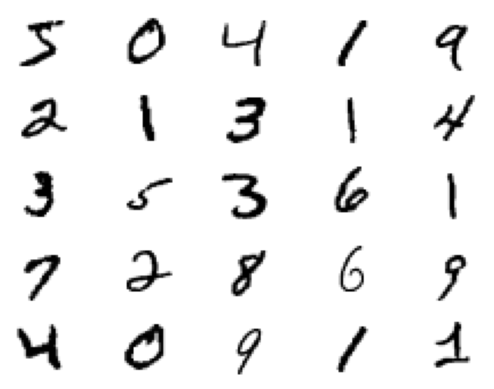

In [3]:
for i in range(25):
    # define subplot
    plt.subplot(5, 5, 1 + i)  # turn off axis
    plt.axis('off')  # plot raw pixel data
    plt.imshow(X_train[i], cmap='gray_r')

# Preprocessing Data

In [4]:
print('X_train.shape', X_train.shape)
print('y_train.shape', y_train.shape)

# reshaping the inputs
X_train = X_train.reshape(60000, 28*28)

# normalizing the inputs (-1, 1)
X_train = (X_train.astype('float32') / 255 - 0.5) * 2

print('X_train reshape:', X_train.shape)

X_train.shape (60000, 28, 28)
y_train.shape (60000,)
X_train reshape: (60000, 784)




# Generator

In [5]:
# latent space dimension
latent_dim = 100

# imagem dimension 28x28
img_dim = 784

init = initializers.RandomNormal(stddev=0.02)

# Generator network
generator = Sequential()

# Input layer and hidden layer 1
generator.add(Dense(128, input_shape=(latent_dim,), kernel_initializer=init))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization(momentum=0.8))

# Hidden layer 2
generator.add(Dense(256))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization(momentum=0.8))

# Hidden layer 3
generator.add(Dense(512))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization(momentum=0.8))


# Output layer 
generator.add(Dense(img_dim, activation='tanh'))

#### Generator model visualization

In [6]:
# prints a summary representation of your model
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               12928     
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128)               0         
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 256)               0         
                                                                 
 batch_normalization_1 (Batc  (None, 256)              1024      
 hNormalization)                                        

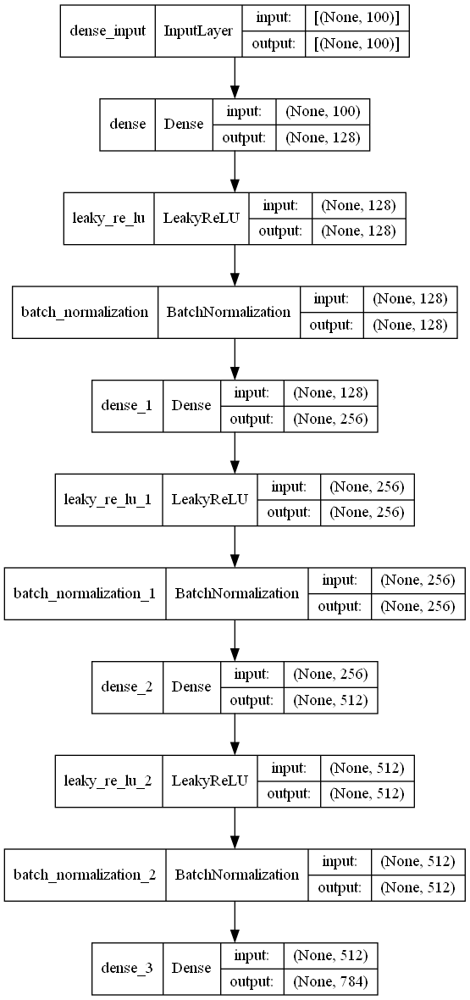

In [7]:
tensorflow.keras.utils.plot_model(generator, show_shapes=True)

#### Conditional G model
The prior input noise $p_z(z)$, and $y$ are combined in joint hidden representation.

In [8]:
# Embedding condition in input layer
num_classes = 10

# Create label embeddings
label = Input(shape=(1,), dtype='int32')
label_embedding = Embedding(num_classes, latent_dim)(label)
label_embedding = Flatten()(label_embedding)

# latent space
z = Input(shape=(latent_dim,))

# Merge inputs (z x label)
input_generator = multiply([z, label_embedding])

# Output image
img = generator(input_generator)

# Generator with condition input
generator = Model([z, label], img)

#### Conditional model visualization

In [9]:
# prints a summary representation of your model
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 100)       1000        ['input_1[0][0]']                
                                                                                                  
 input_2 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 flatten (Flatten)              (None, 100)          0           ['embedding[0][0]']              
                                                                                              

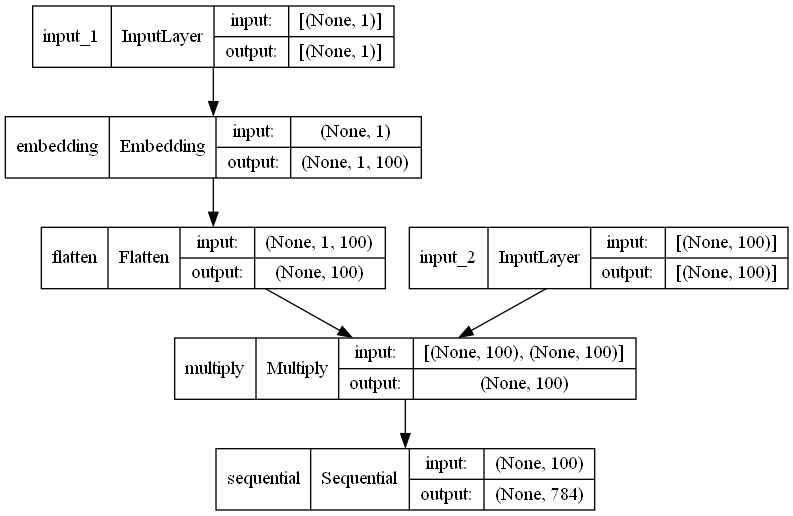

In [10]:
tensorflow.keras.utils.plot_model(generator, show_shapes=True)

#### Discriminator

In [13]:
# Discriminator network
discriminator = Sequential()

# Input layer and hidden layer 1
discriminator.add(Dense(128, input_shape=(img_dim,), kernel_initializer=init))
discriminator.add(LeakyReLU(alpha=0.2))

# Hidden layer 2
discriminator.add(Dense(256))
discriminator.add(LeakyReLU(alpha=0.2))

# Hidden layer 3
discriminator.add(Dense(512))
discriminator.add(LeakyReLU(alpha=0.2))

# Output layer
discriminator.add(Dense(1, activation='sigmoid'))

#### Discriminator model visualization

In [14]:
# prints a summary representation of your model
discriminator.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 128)               100480    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 128)               0         
                                                                 
 dense_9 (Dense)             (None, 256)               33024     
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_10 (Dense)            (None, 512)               131584    
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 512)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                

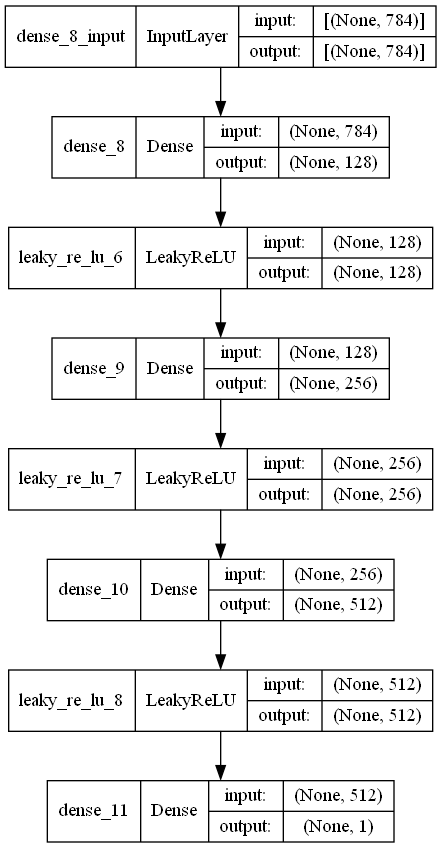

In [15]:
tensorflow.keras.utils.plot_model(discriminator, show_shapes=True)

#### Conditional D model

$x$ and $y$ are presented as inputs

In [16]:
# Embedding condition in input layer

# Create label embeddings
label_d = Input(shape=(1,), dtype='int32')
label_embedding_d = Embedding(num_classes, img_dim)(label_d)
label_embedding_d = Flatten()(label_embedding_d)

# imagem dimension 28x28
img_d = Input(shape=(img_dim,))

# Merge inputs (img x label)
input_discriminator = multiply([img_d, label_embedding_d])

# Output image
validity = discriminator(input_discriminator)

# Discriminator with condition input
discriminator = Model([img_d, label_d], validity)

#### Conditional model visualization

In [17]:
# prints a summary representation of your model
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 1, 784)       7840        ['input_3[0][0]']                
                                                                                                  
 input_4 (InputLayer)           [(None, 784)]        0           []                               
                                                                                                  
 flatten_1 (Flatten)            (None, 784)          0           ['embedding_1[0][0]']            
                                                                                            

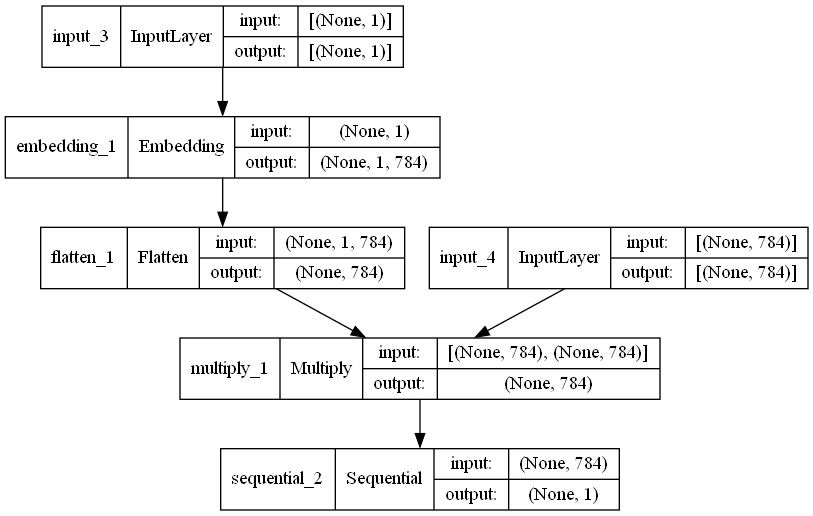

In [18]:
tensorflow.keras.utils.plot_model(discriminator, show_shapes=True)

#### Compile discriminator

In [19]:
# Optimizer
optimizer = Adam(lr=0.0002, beta_1=0.5)

discriminator.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['binary_accuracy'])

c:\users\kashani\appdata\local\programs\python\python39\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


#### Combined network

In [20]:
discriminator.trainable = False

validity = discriminator([generator([z, label]), label])

d_g = Model([z, label], validity)

d_g.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['binary_accuracy'])

In [15]:
# prints a summary representation of your model
d_g.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 model (Functional)             (None, 784)          584312      ['input_2[0][0]',                
                                                                  'input_1[0][0]']                
                                                                                                  
 model_1 (Functional)           (None, 1)            273441      ['model[0][0]',            

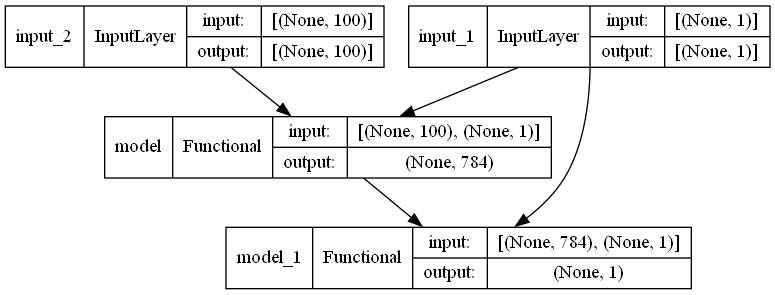

In [21]:
tensorflow.keras.utils.plot_model(d_g, show_shapes=True)

# Train model


epoch = 1/100, d_loss=0.628, g_loss=0.912                                                                                                                        


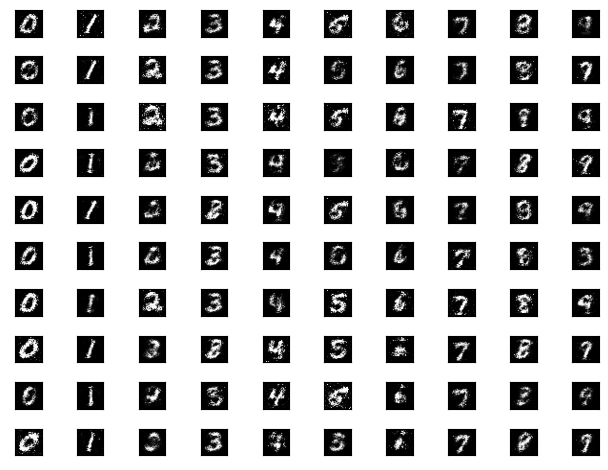

epoch = 2/100, d_loss=0.601, g_loss=0.893                                                                                                                        


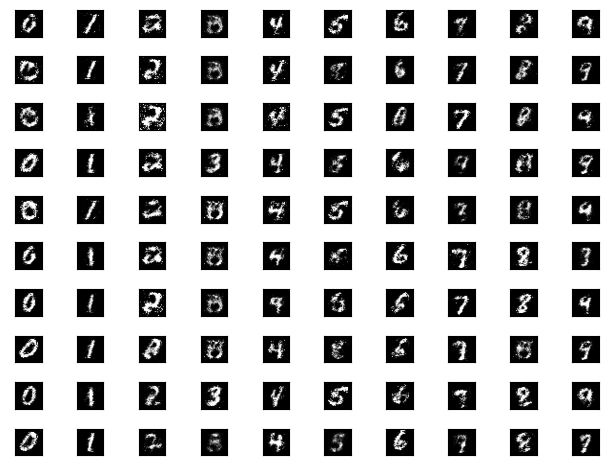

epoch = 3/100, d_loss=0.637, g_loss=0.867                                                                                                                        


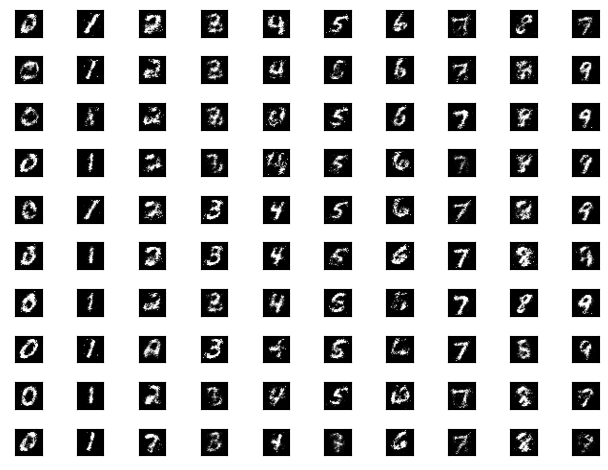

epoch = 4/100, d_loss=0.644, g_loss=0.810                                                                                                                        


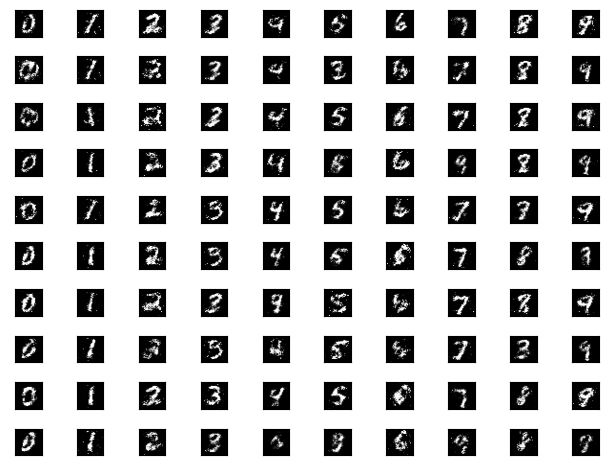

epoch = 5/100, d_loss=0.656, g_loss=0.882                                                                                                                        


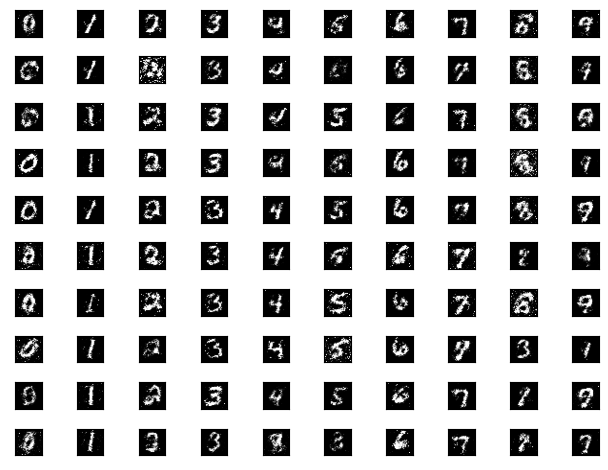

epoch = 6/100, d_loss=0.650, g_loss=0.892                                                                                                                        


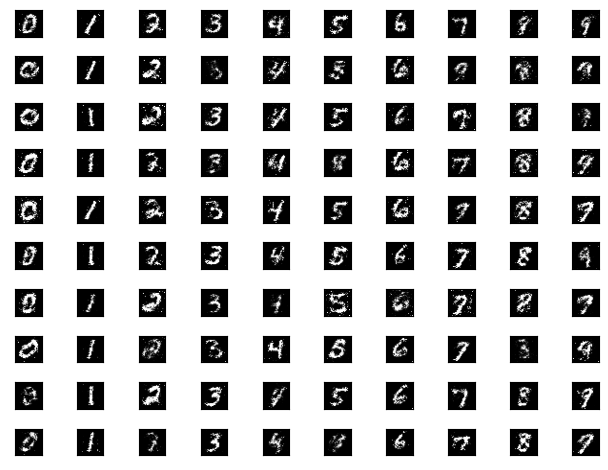

epoch = 7/100, d_loss=0.602, g_loss=0.869                                                                                                                        


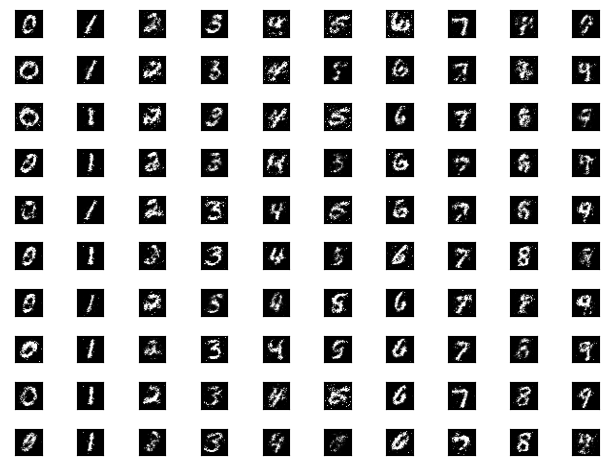

epoch = 8/100, d_loss=0.624, g_loss=0.922                                                                                                                        


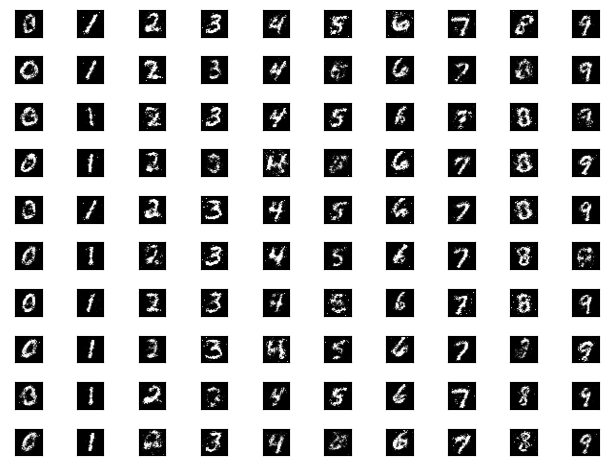

epoch = 9/100, d_loss=0.686, g_loss=0.885                                                                                                                        


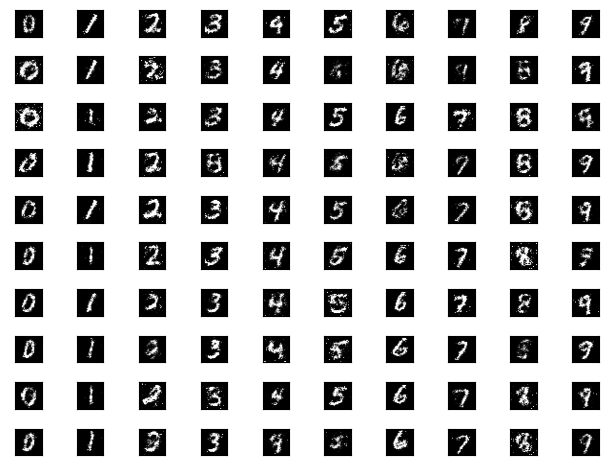

epoch = 10/100, d_loss=0.605, g_loss=0.944                                                                                                                        


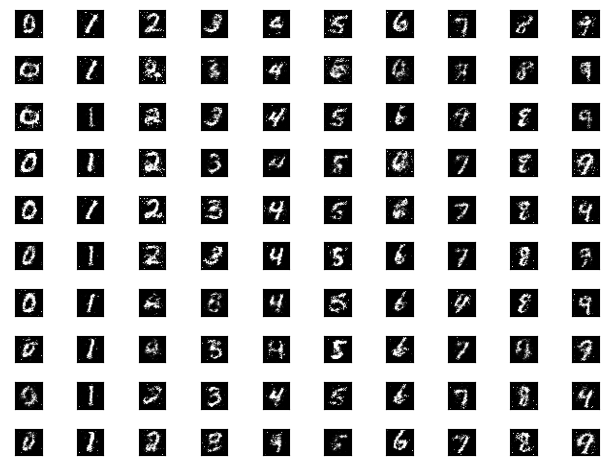

epoch = 11/100, d_loss=0.582, g_loss=0.859                                                                                                                        


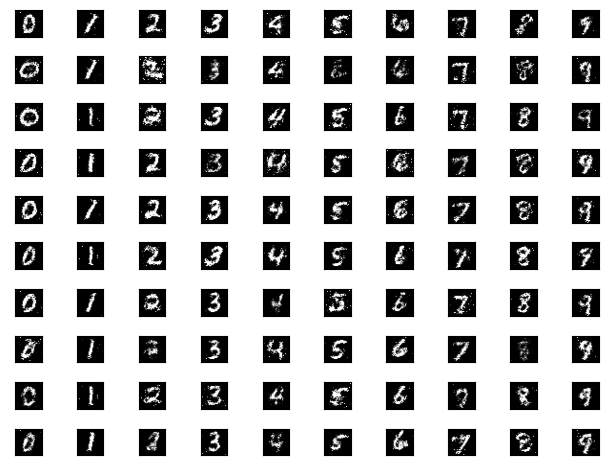

epoch = 12/100, d_loss=0.613, g_loss=0.956                                                                                                                        


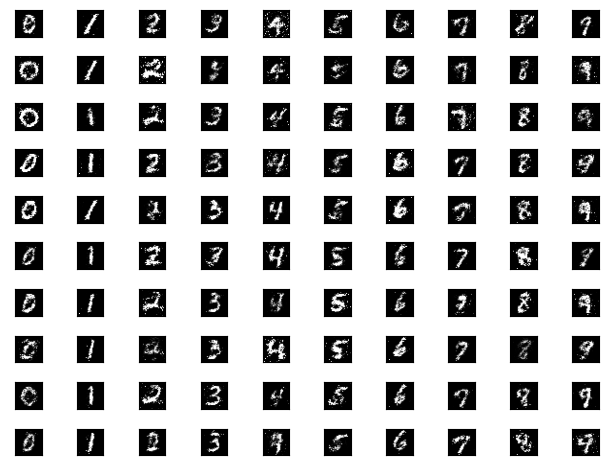

epoch = 13/100, d_loss=0.543, g_loss=1.020                                                                                                                        


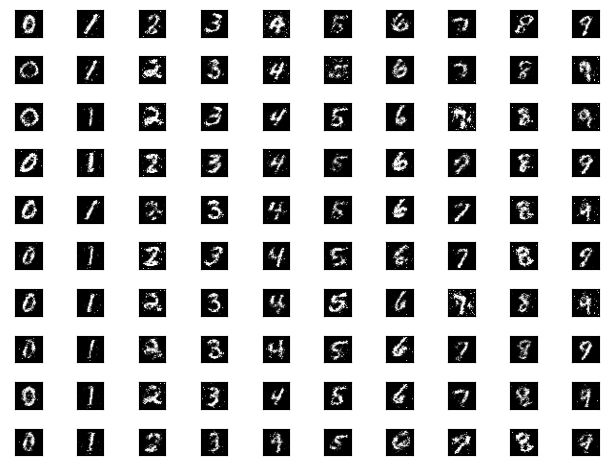

epoch = 14/100, d_loss=0.616, g_loss=0.975                                                                                                                        


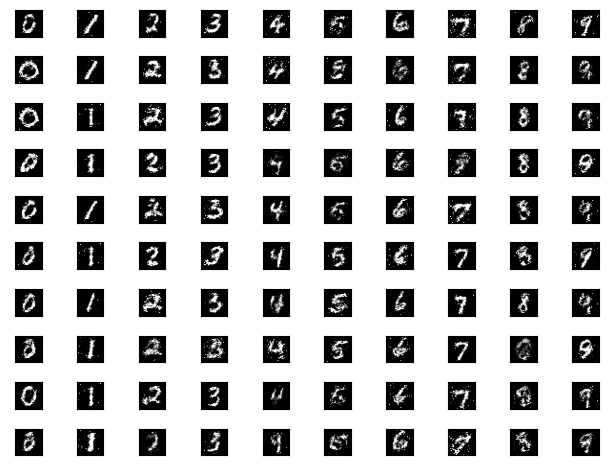

epoch = 15/100, d_loss=0.609, g_loss=0.942                                                                                                                        


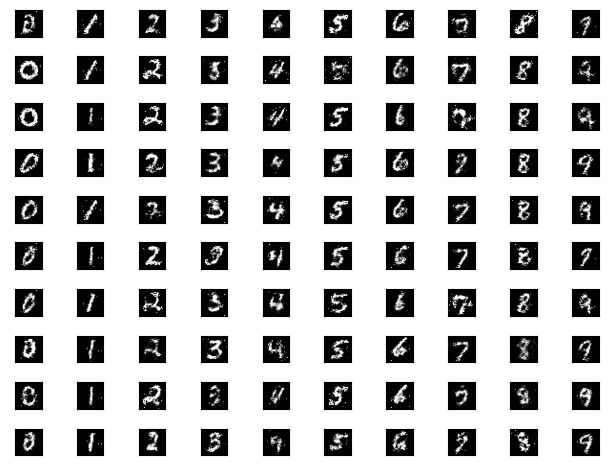

epoch = 16/100, d_loss=0.646, g_loss=0.930                                                                                                                        


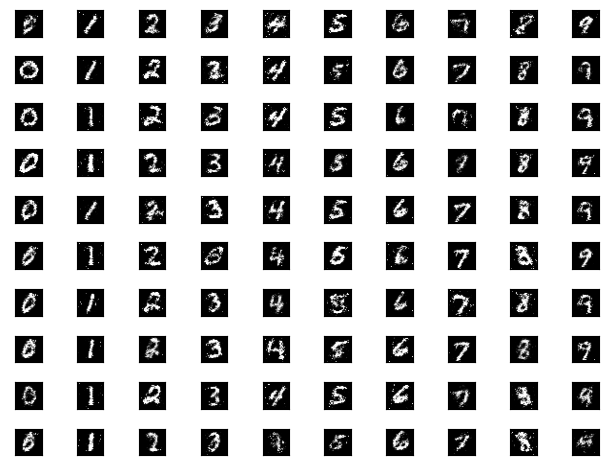

epoch = 17/100, d_loss=0.603, g_loss=0.959                                                                                                                        


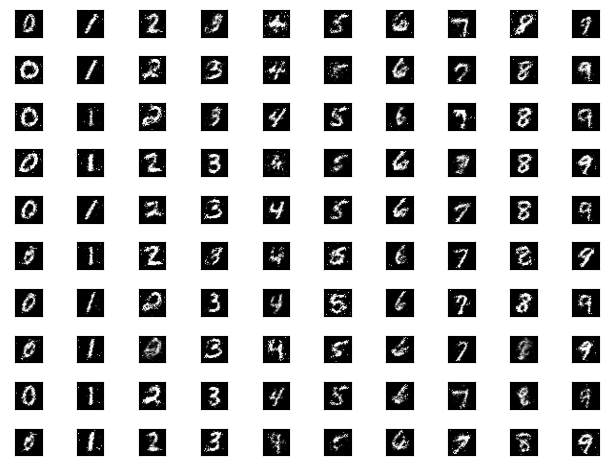

epoch = 18/100, d_loss=0.633, g_loss=0.919                                                                                                                        


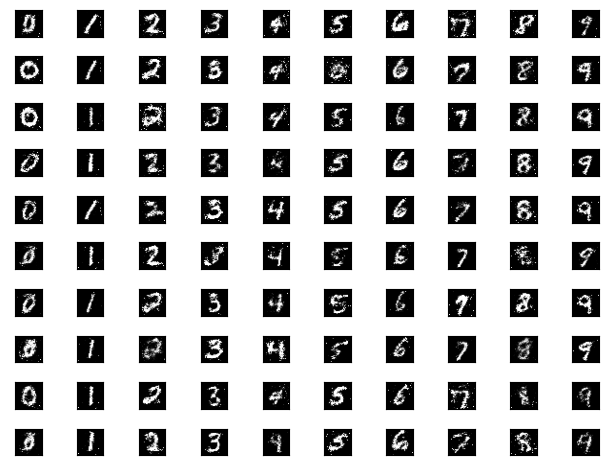

epoch = 19/100, d_loss=0.640, g_loss=0.906                                                                                                                        


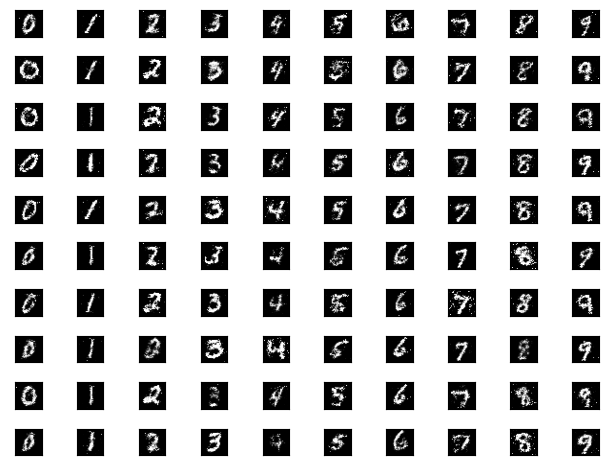

epoch = 20/100, d_loss=0.581, g_loss=0.942                                                                                                                        


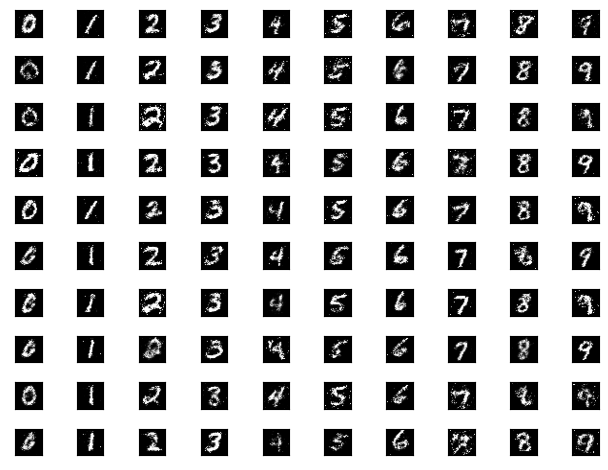

epoch = 21/100, d_loss=0.608, g_loss=0.900                                                                                                                        


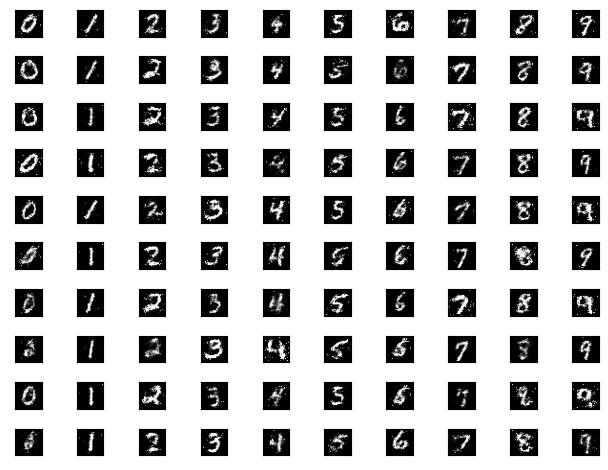

epoch = 22/100, d_loss=0.723, g_loss=0.945                                                                                                                        


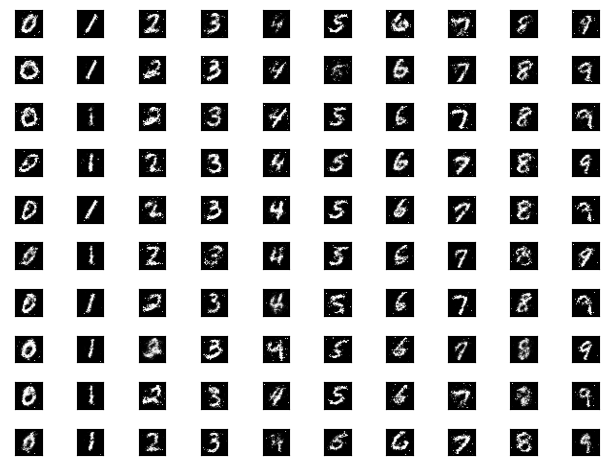

epoch = 23/100, d_loss=0.614, g_loss=0.968                                                                                                                        


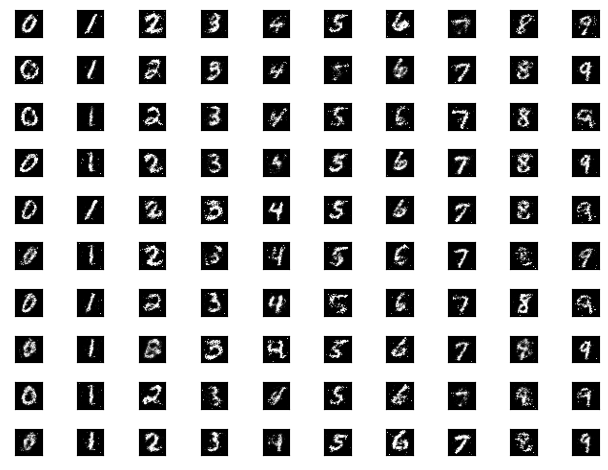

epoch = 24/100, d_loss=0.607, g_loss=1.000                                                                                                                        


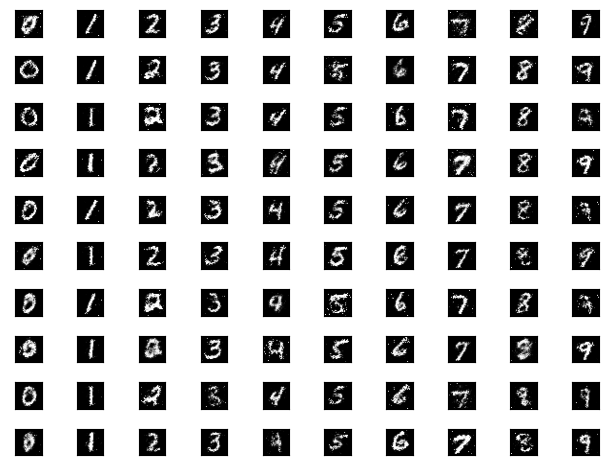

epoch = 25/100, d_loss=0.613, g_loss=0.837                                                                                                                        


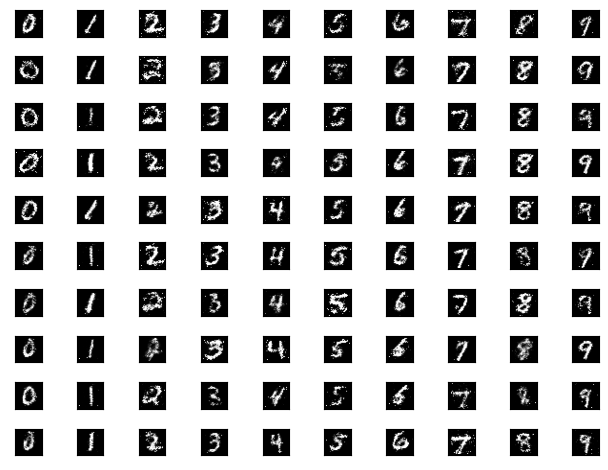

epoch = 26/100, d_loss=0.716, g_loss=0.919                                                                                                                        


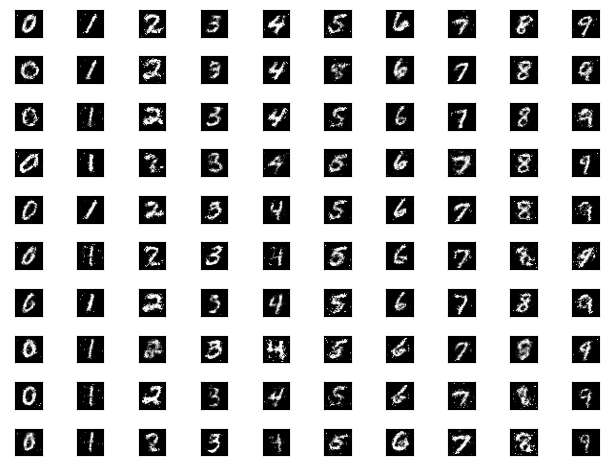

epoch = 27/100, d_loss=0.580, g_loss=0.913                                                                                                                        


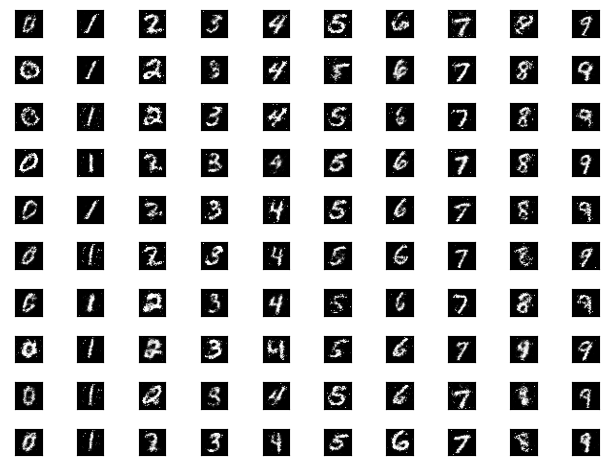

epoch = 28/100, d_loss=0.607, g_loss=1.030                                                                                                                        


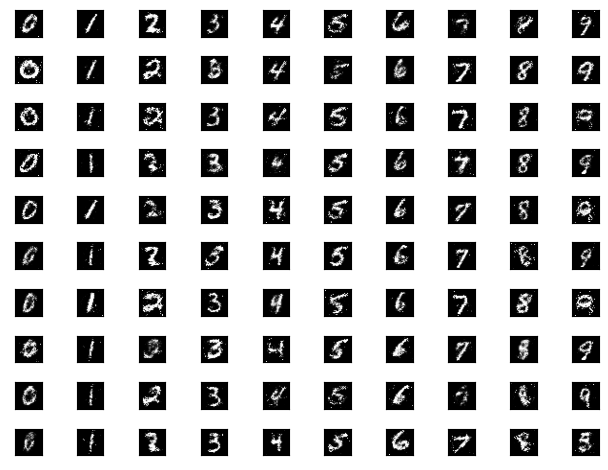

epoch = 29/100, d_loss=0.613, g_loss=0.909                                                                                                                        


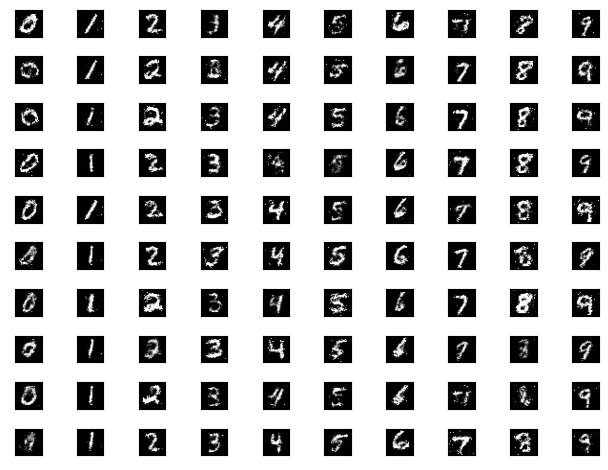

epoch = 30/100, d_loss=0.618, g_loss=0.852                                                                                                                        


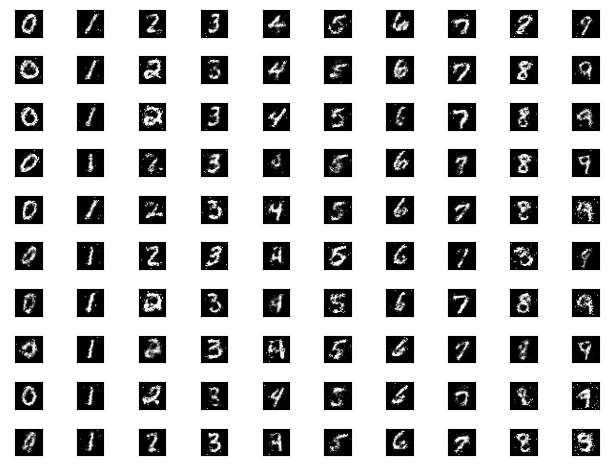

epoch = 31/100, d_loss=0.650, g_loss=0.848                                                                                                                        


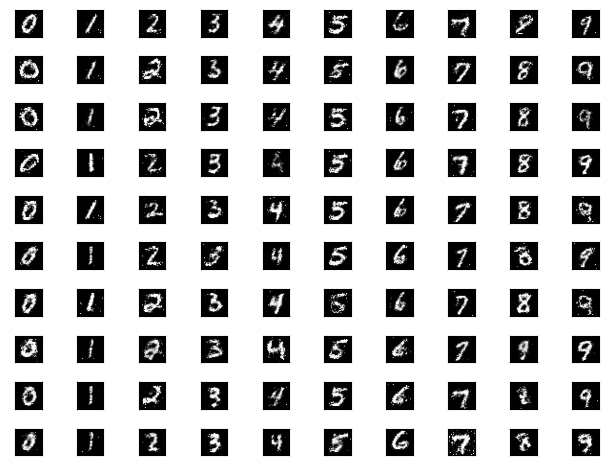

epoch = 32/100, d_loss=0.631, g_loss=0.883                                                                                                                        


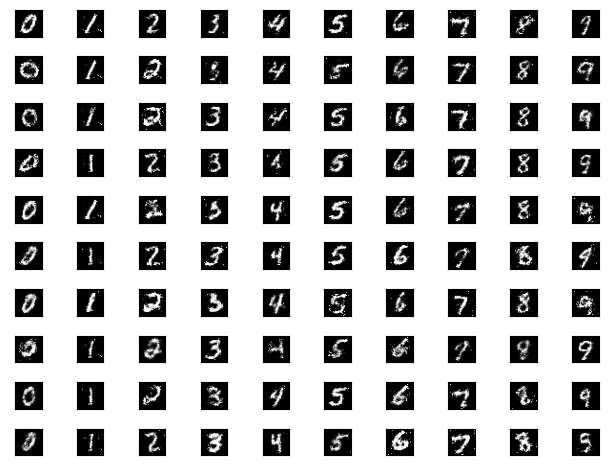

epoch = 33/100, d_loss=0.621, g_loss=0.884                                                                                                                        


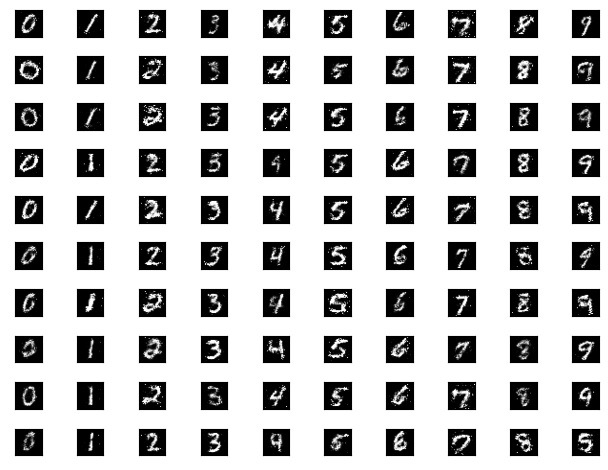

epoch = 34/100, d_loss=0.637, g_loss=0.936                                                                                                                        


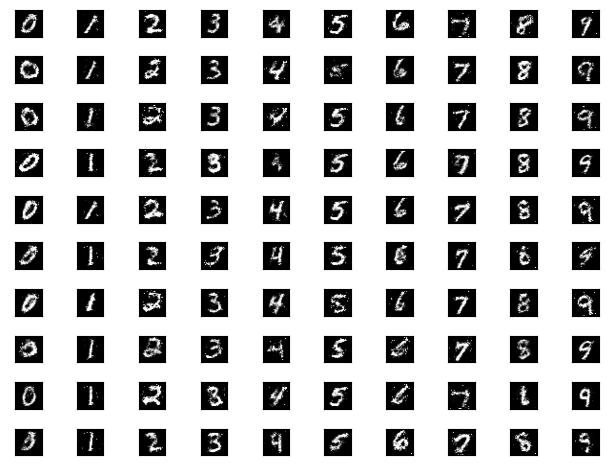

epoch = 35/100, d_loss=0.630, g_loss=0.860                                                                                                                        


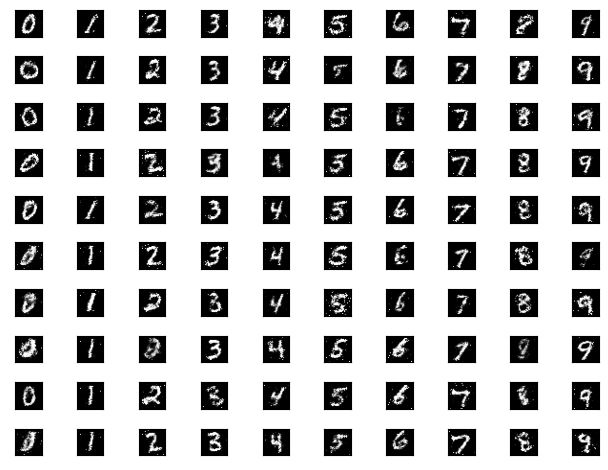

epoch = 36/100, d_loss=0.622, g_loss=0.947                                                                                                                        


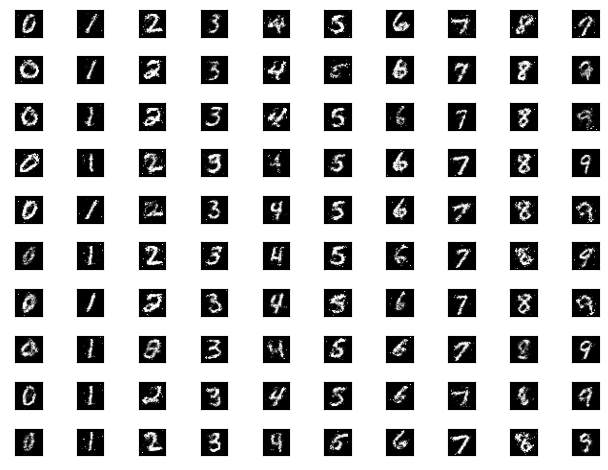

epoch = 37/100, d_loss=0.631, g_loss=0.916                                                                                                                        


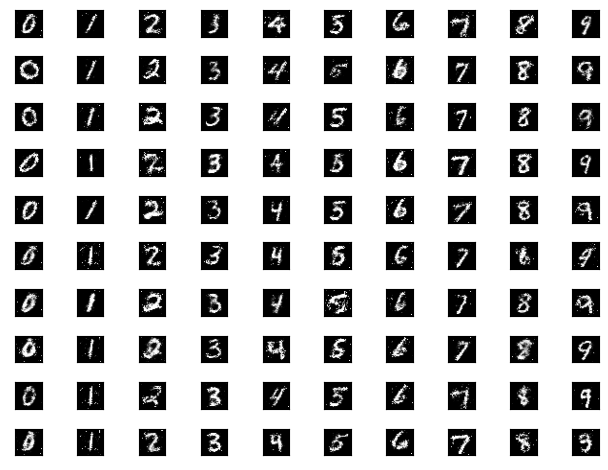

epoch = 38/100, d_loss=0.598, g_loss=0.892                                                                                                                        


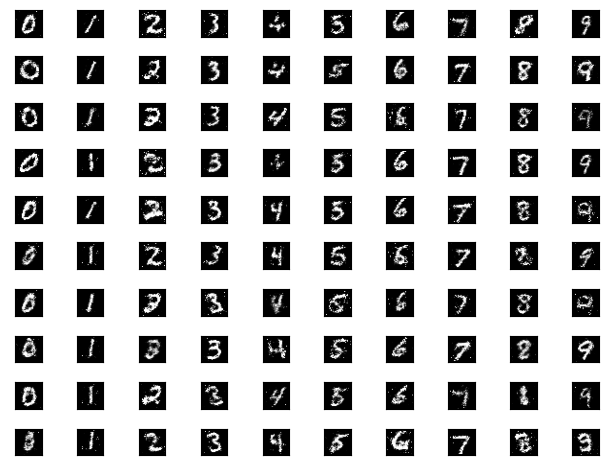

epoch = 39/100, d_loss=0.640, g_loss=0.921                                                                                                                        


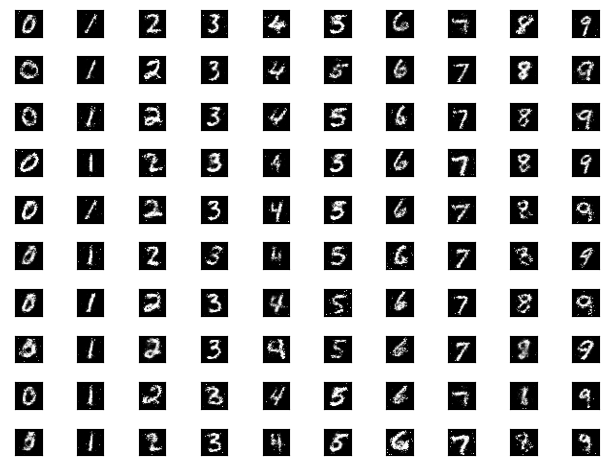

epoch = 40/100, d_loss=0.590, g_loss=0.899                                                                                                                        


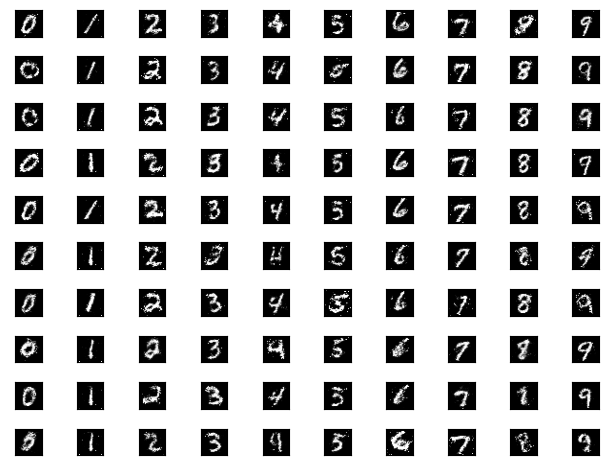

epoch = 41/100, d_loss=0.609, g_loss=0.888                                                                                                                        


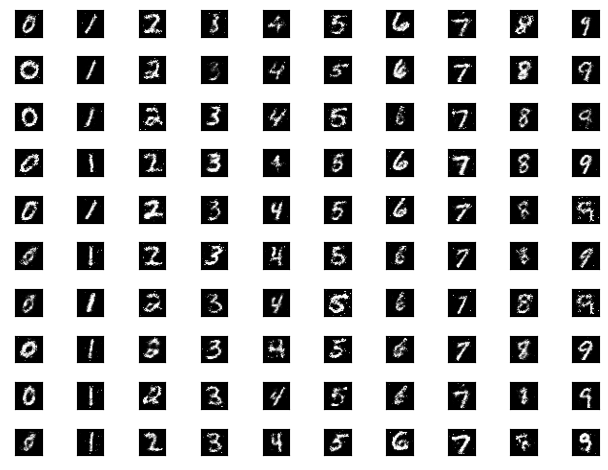

epoch = 42/100, d_loss=0.665, g_loss=0.976                                                                                                                        


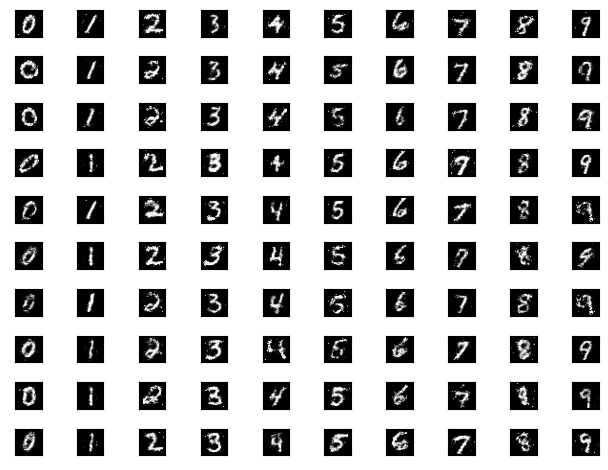

epoch = 43/100, d_loss=0.621, g_loss=0.875                                                                                                                        


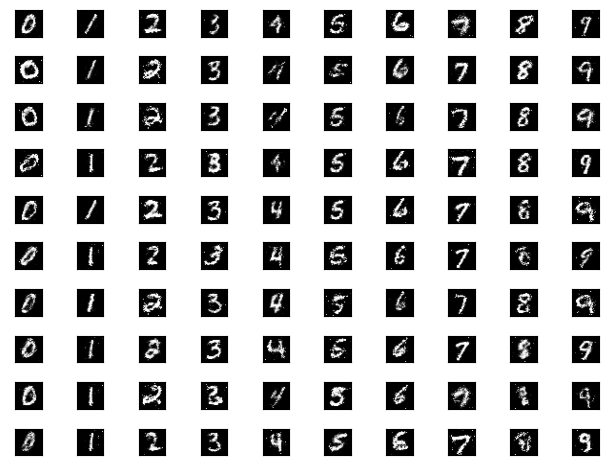

epoch = 44/100, d_loss=0.592, g_loss=0.861                                                                                                                        


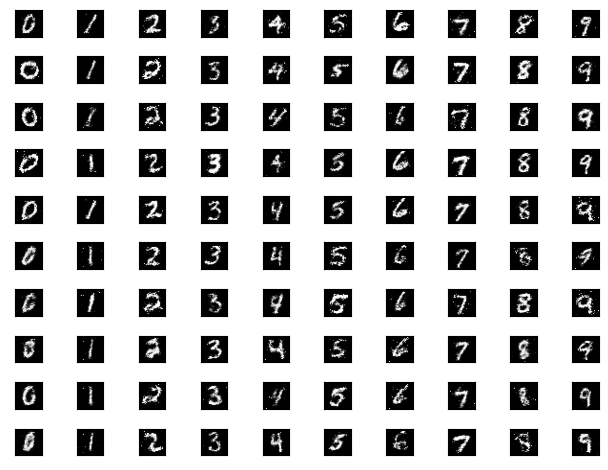

epoch = 45/100, d_loss=0.613, g_loss=0.834                                                                                                                        


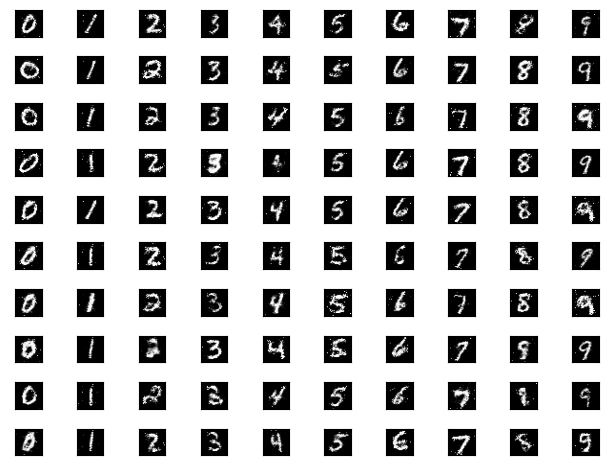

epoch = 46/100, d_loss=0.606, g_loss=0.905                                                                                                                        


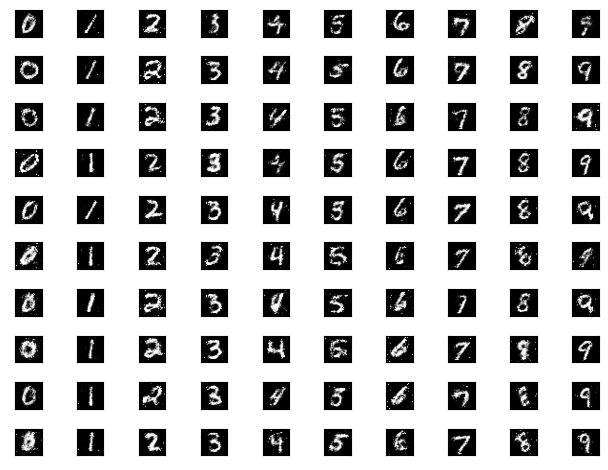

epoch = 47/100, d_loss=0.655, g_loss=0.890                                                                                                                        


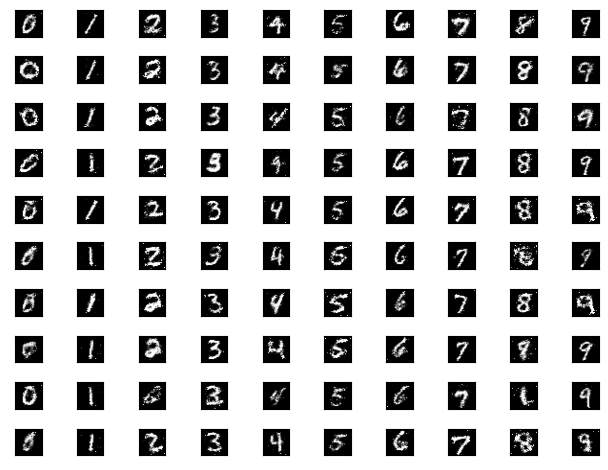

epoch = 48/100, d_loss=0.647, g_loss=0.844                                                                                                                        


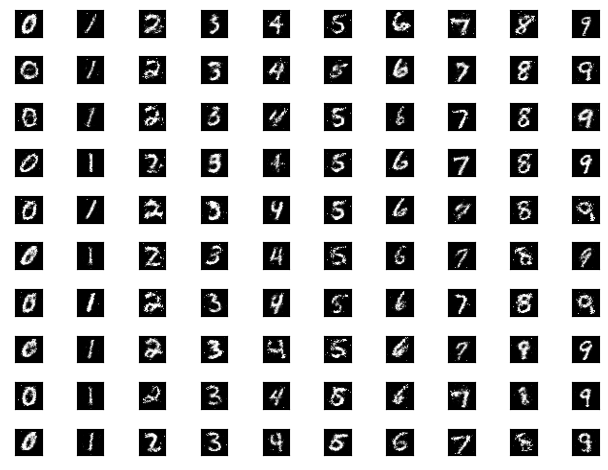

epoch = 49/100, d_loss=0.591, g_loss=0.923                                                                                                                        


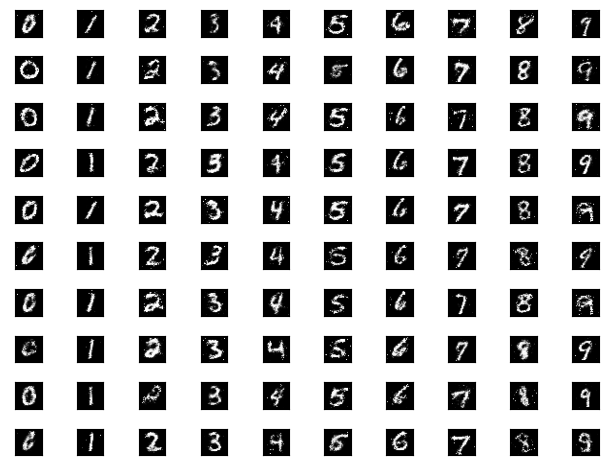

epoch = 50/100, d_loss=0.652, g_loss=0.879                                                                                                                        


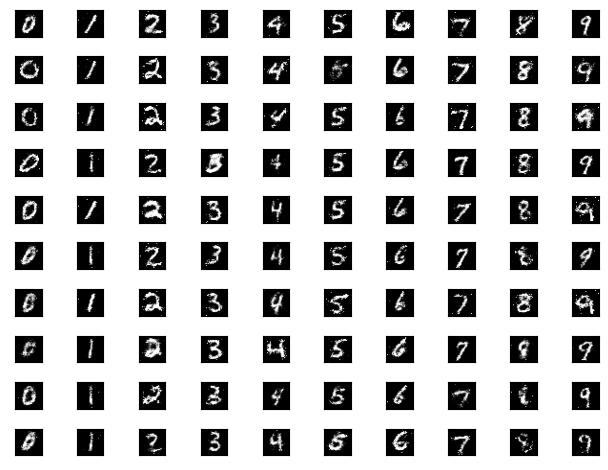

epoch = 51/100, d_loss=0.608, g_loss=0.965                                                                                                                        


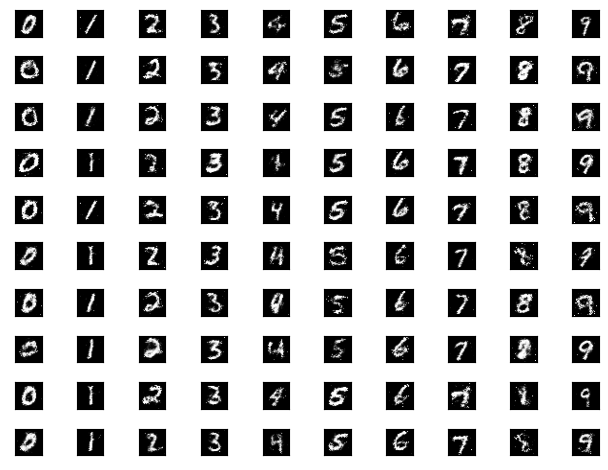

epoch = 52/100, d_loss=0.608, g_loss=0.786                                                                                                                        


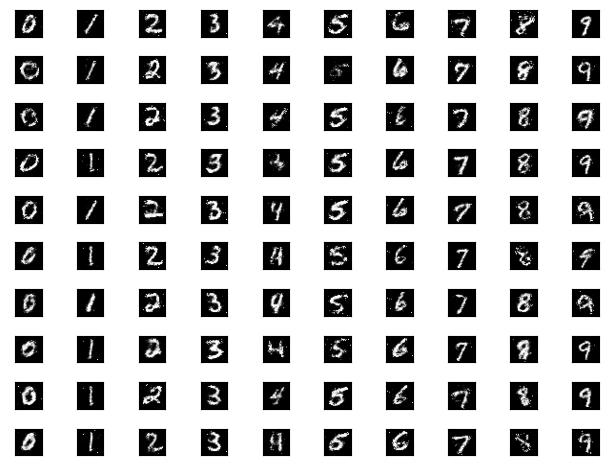

epoch = 53/100, d_loss=0.622, g_loss=0.987                                                                                                                        


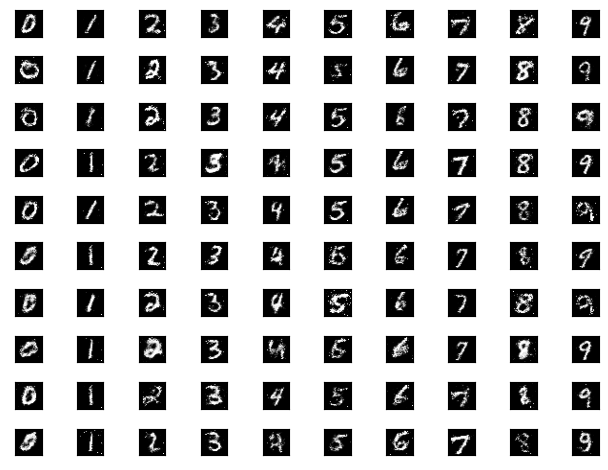

epoch = 54/100, d_loss=0.616, g_loss=0.886                                                                                                                        


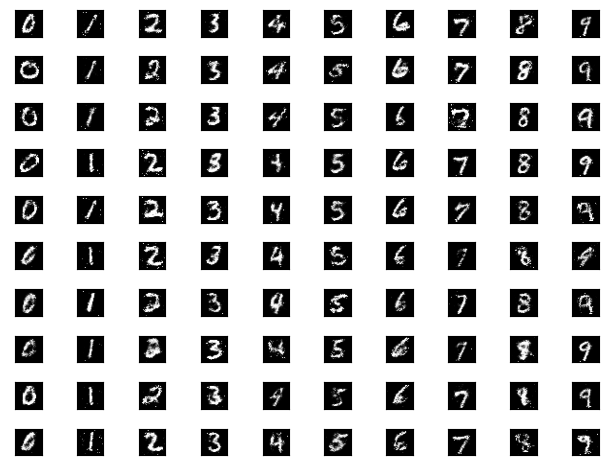

epoch = 55/100, d_loss=0.627, g_loss=0.906                                                                                                                        


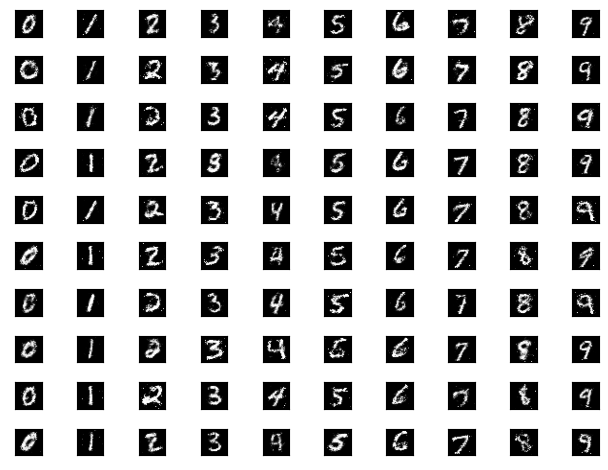

epoch = 56/100, d_loss=0.581, g_loss=0.804                                                                                                                        


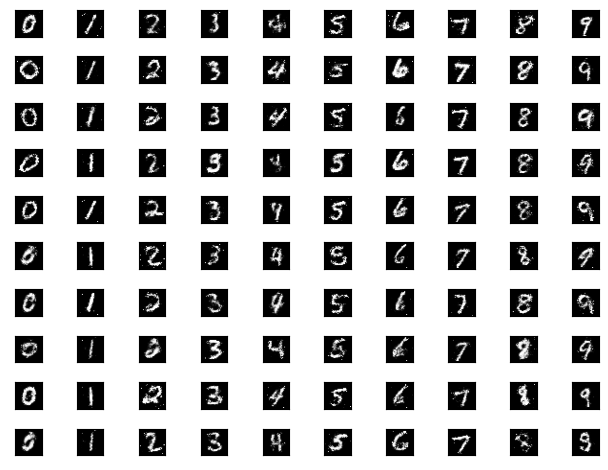

epoch = 57/100, d_loss=0.596, g_loss=0.895                                                                                                                        


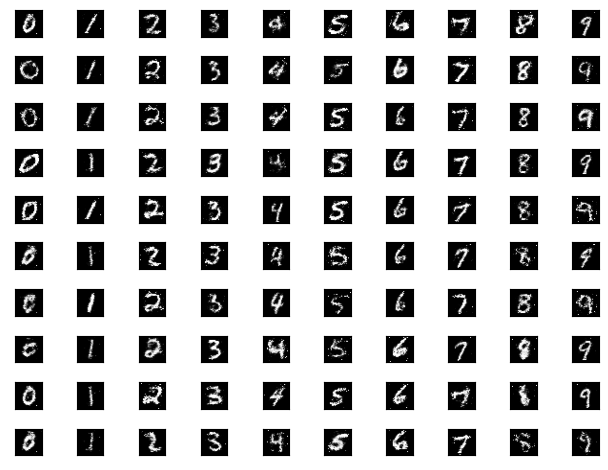

epoch = 58/100, d_loss=0.591, g_loss=0.917                                                                                                                        


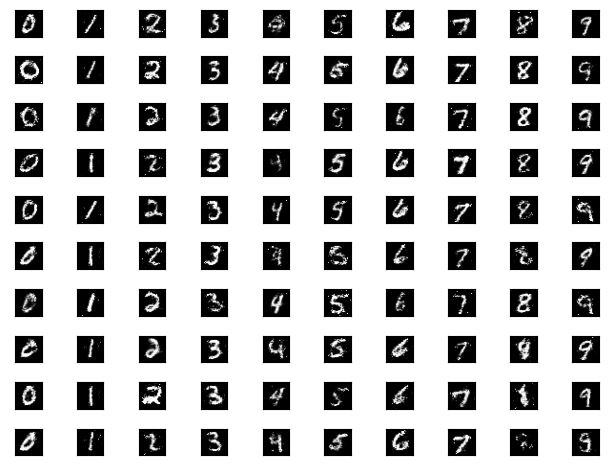

epoch = 59/100, d_loss=0.621, g_loss=0.931                                                                                                                        


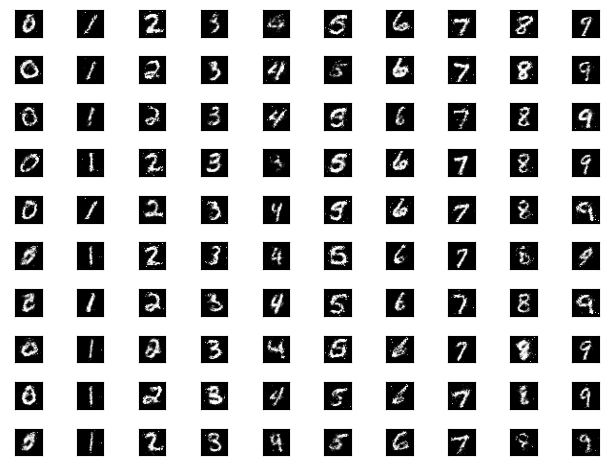

epoch = 60/100, d_loss=0.571, g_loss=0.942                                                                                                                        


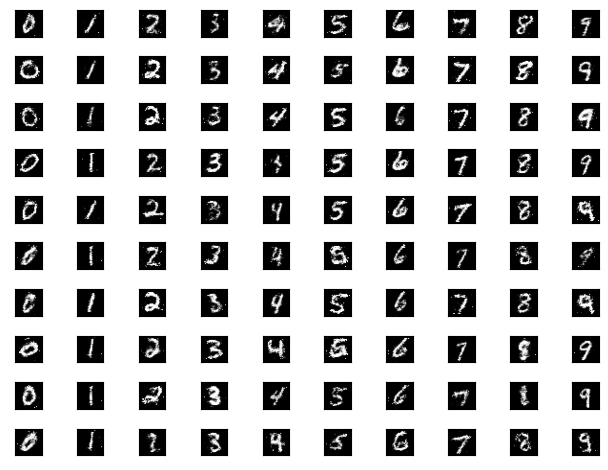

epoch = 61/100, d_loss=0.640, g_loss=0.842                                                                                                                        


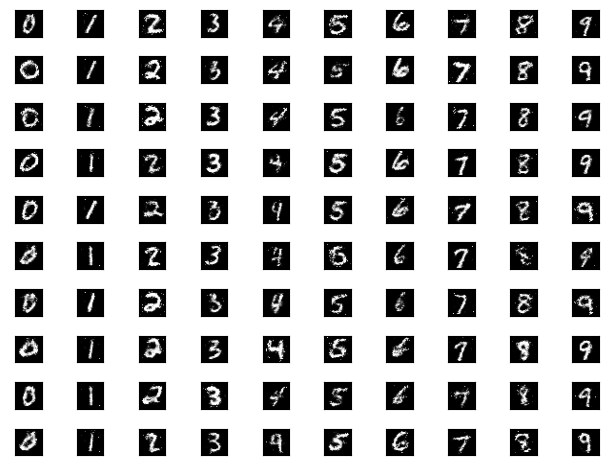

epoch = 62/100, d_loss=0.607, g_loss=0.823                                                                                                                        


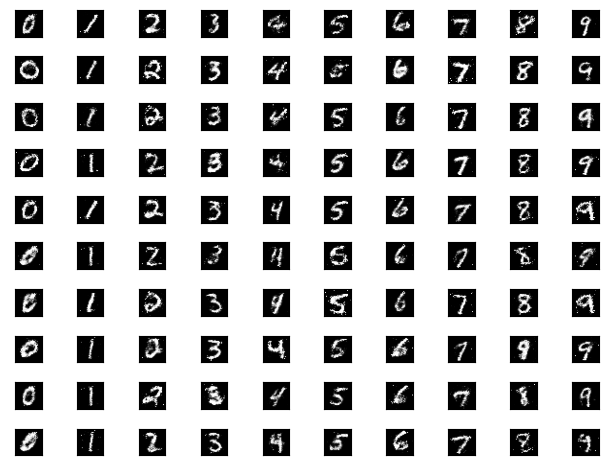

epoch = 63/100, d_loss=0.653, g_loss=1.008                                                                                                                        


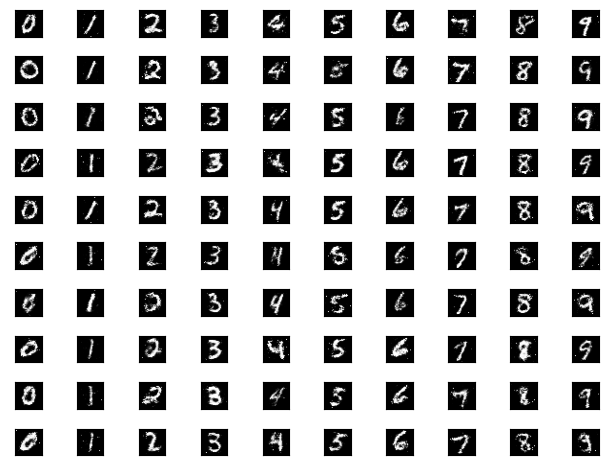

epoch = 64/100, d_loss=0.610, g_loss=0.988                                                                                                                        


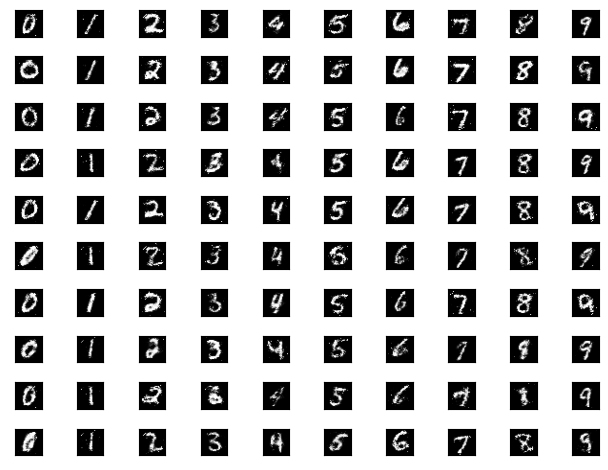

epoch = 65/100, d_loss=0.566, g_loss=0.890                                                                                                                        


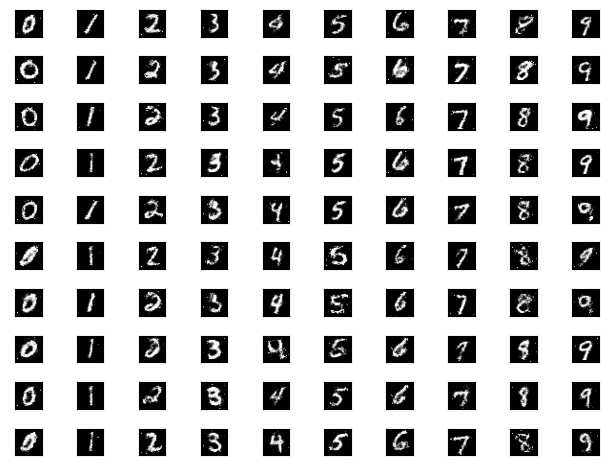

epoch = 66/100, d_loss=0.568, g_loss=0.964                                                                                                                        


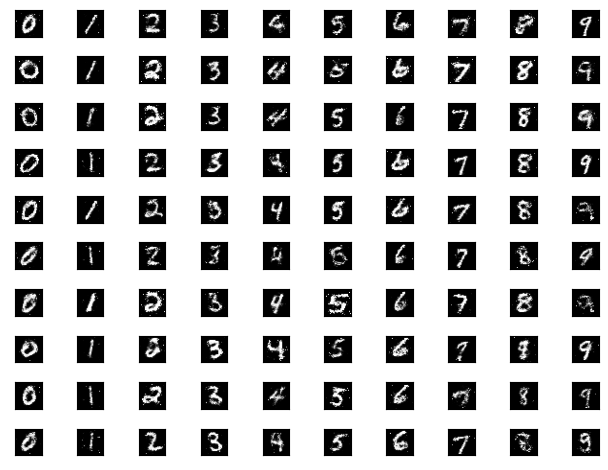

epoch = 67/100, d_loss=0.567, g_loss=0.905                                                                                                                        


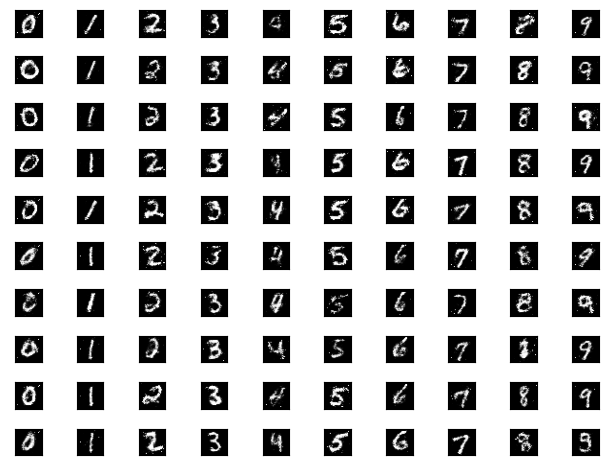

epoch = 68/100, d_loss=0.599, g_loss=1.027                                                                                                                        


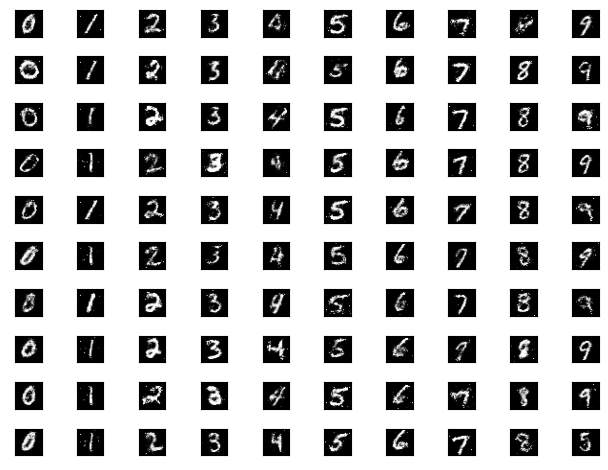

epoch = 69/100, d_loss=0.656, g_loss=0.991                                                                                                                        


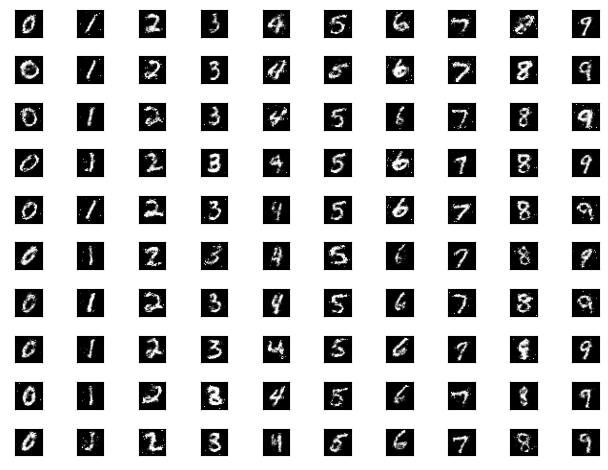

epoch = 70/100, d_loss=0.594, g_loss=0.995                                                                                                                        


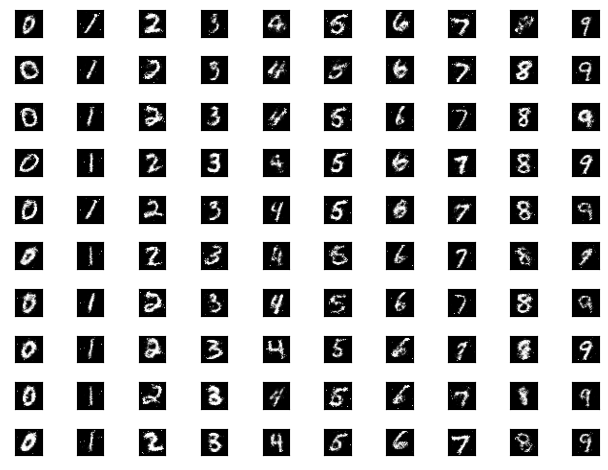

epoch = 71/100, d_loss=0.654, g_loss=0.910                                                                                                                        


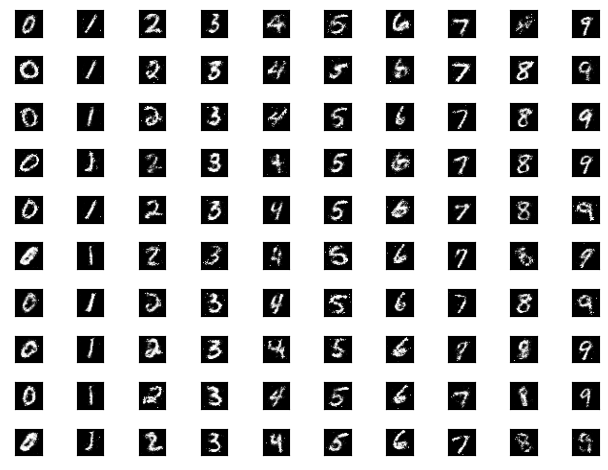

epoch = 72/100, d_loss=0.622, g_loss=0.886                                                                                                                        


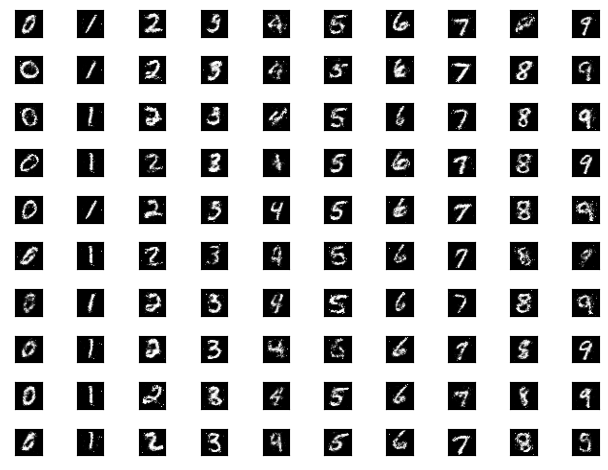

epoch = 73/100, d_loss=0.663, g_loss=0.957                                                                                                                        


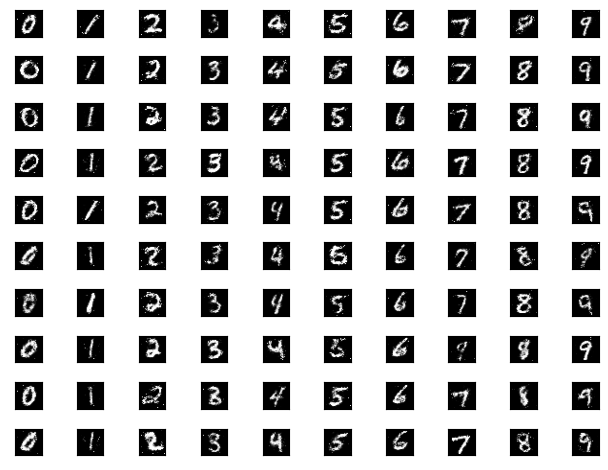

epoch = 74/100, d_loss=0.618, g_loss=0.907                                                                                                                        


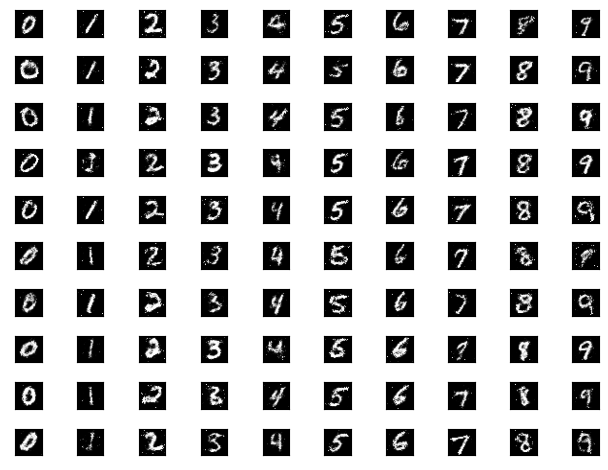

epoch = 75/100, d_loss=0.577, g_loss=1.001                                                                                                                        


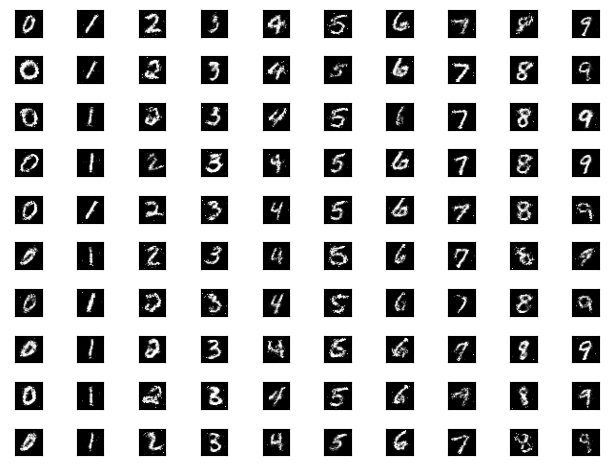

epoch = 76/100, d_loss=0.629, g_loss=0.940                                                                                                                        


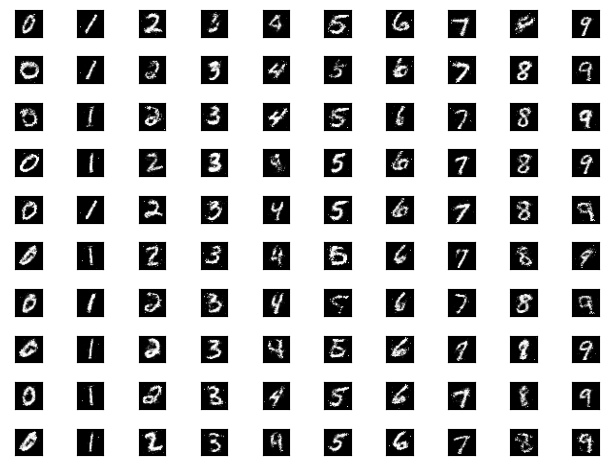

epoch = 77/100, d_loss=0.596, g_loss=0.992                                                                                                                        


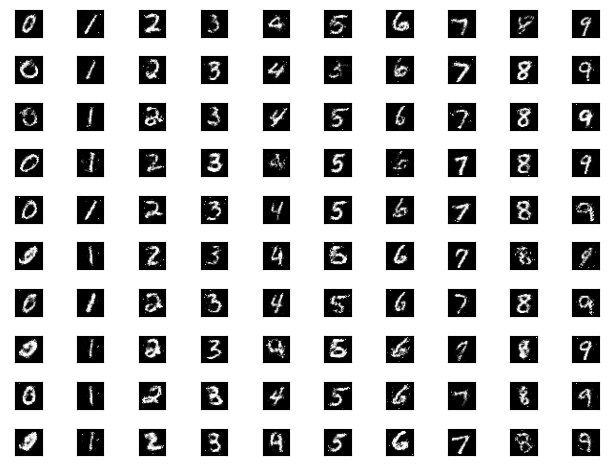

epoch = 78/100, d_loss=0.590, g_loss=0.986                                                                                                                        


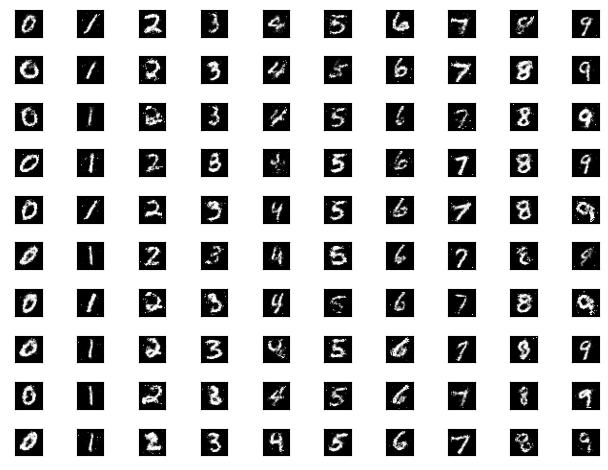

epoch = 79/100, d_loss=0.566, g_loss=0.991                                                                                                                        


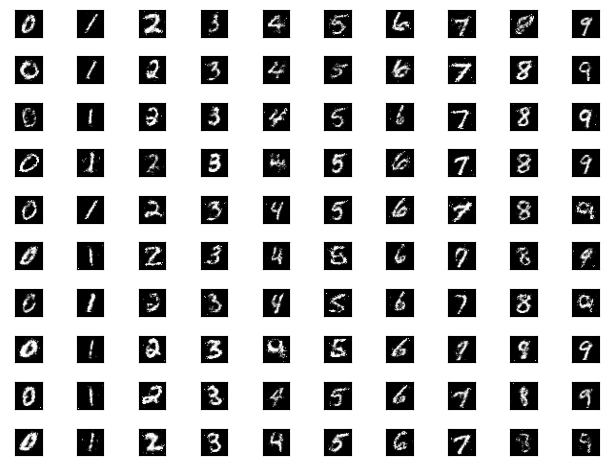

epoch = 80/100, d_loss=0.594, g_loss=0.831                                                                                                                        


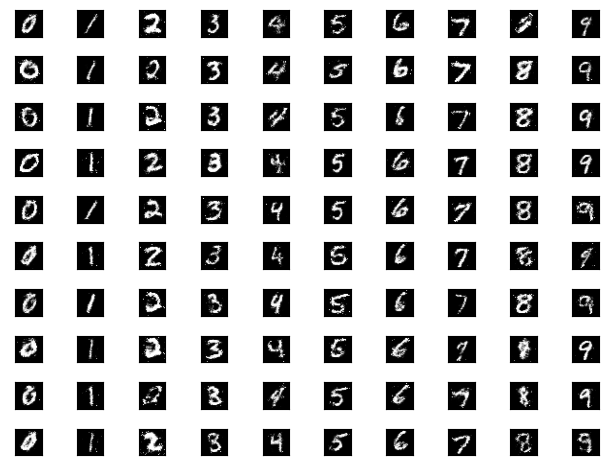

epoch = 81/100, d_loss=0.614, g_loss=1.026                                                                                                                        


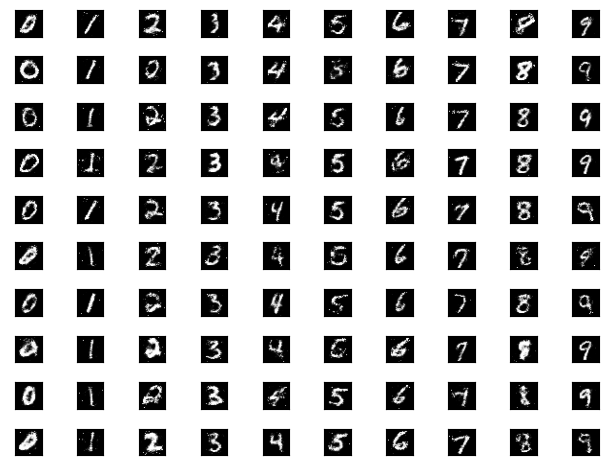

epoch = 82/100, d_loss=0.599, g_loss=0.925                                                                                                                        


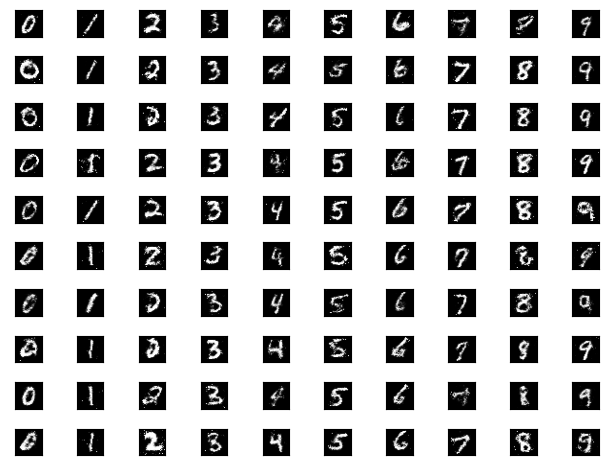

epoch = 83/100, d_loss=0.604, g_loss=0.923                                                                                                                        


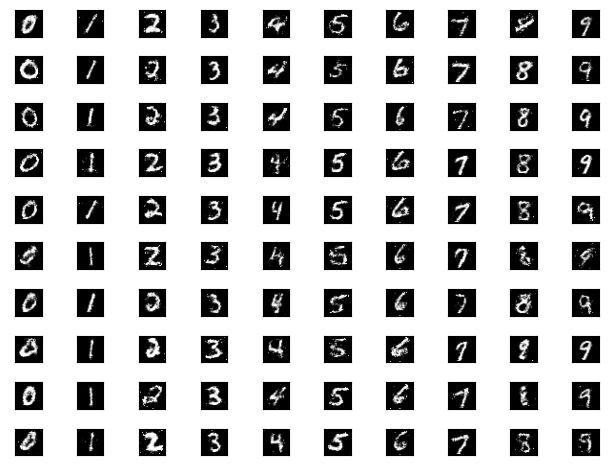

epoch = 84/100, d_loss=0.599, g_loss=1.053                                                                                                                        


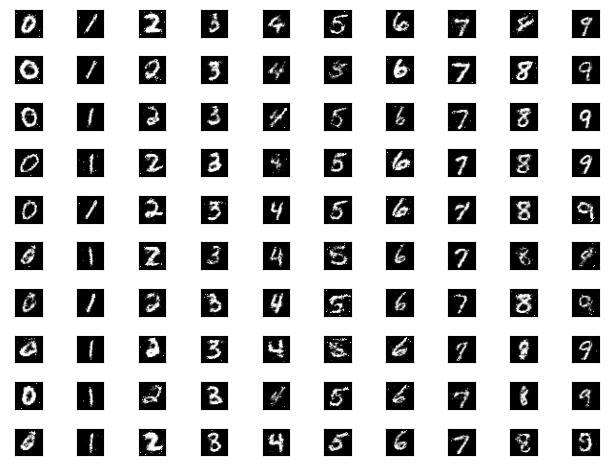

epoch = 85/100, d_loss=0.577, g_loss=0.902                                                                                                                        


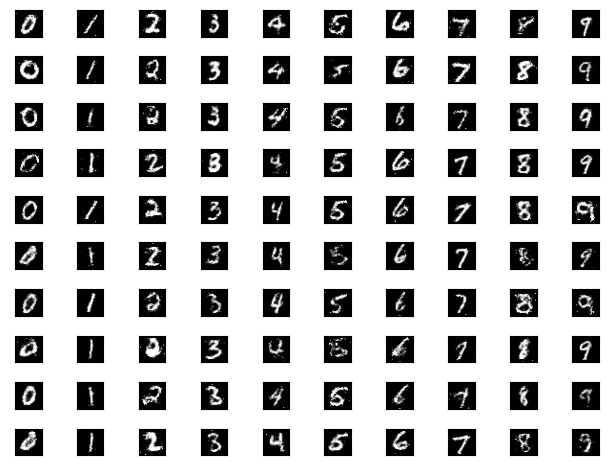

epoch = 86/100, d_loss=0.622, g_loss=0.932                                                                                                                        


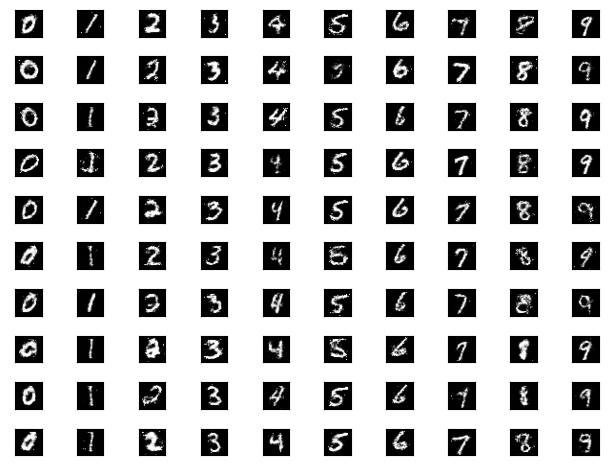

epoch = 87/100, d_loss=0.582, g_loss=0.968                                                                                                                        


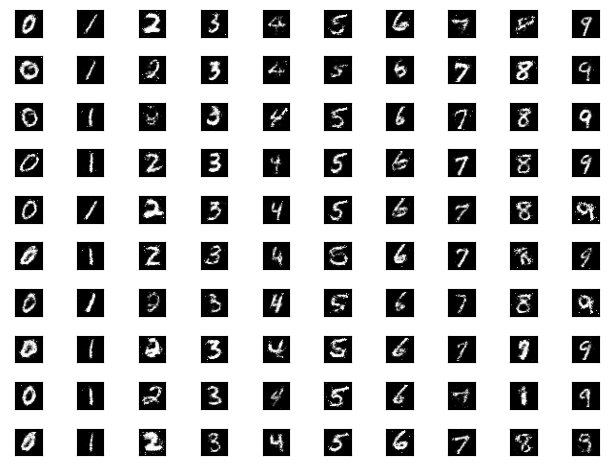

epoch = 88/100, d_loss=0.571, g_loss=0.988                                                                                                                        


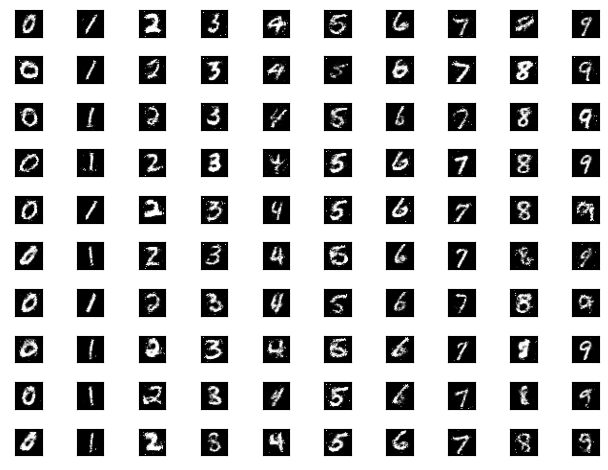

epoch = 89/100, d_loss=0.592, g_loss=0.919                                                                                                                        


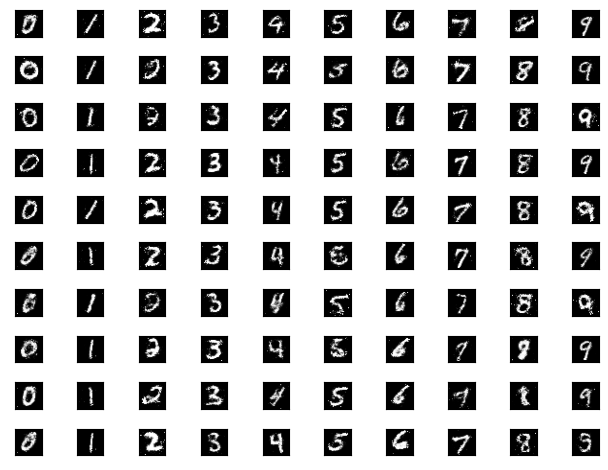

epoch = 90/100, d_loss=0.641, g_loss=0.973                                                                                                                        


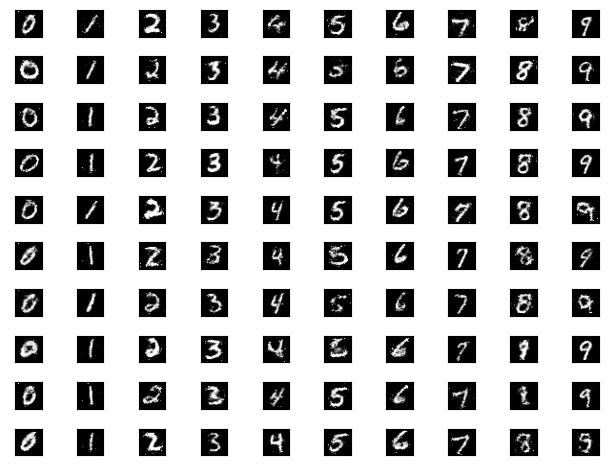

epoch = 91/100, d_loss=0.614, g_loss=0.958                                                                                                                        


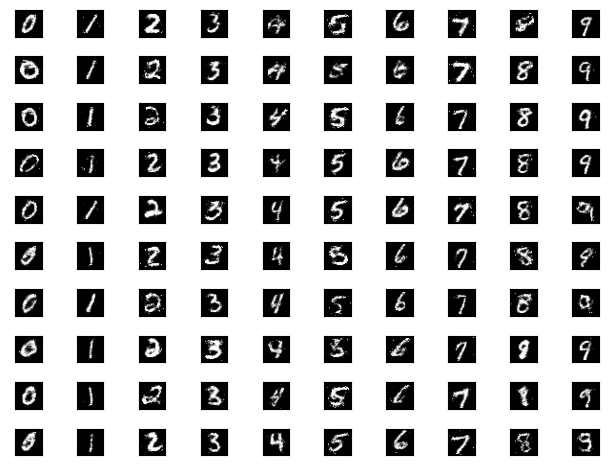

epoch = 92/100, d_loss=0.677, g_loss=0.942                                                                                                                        


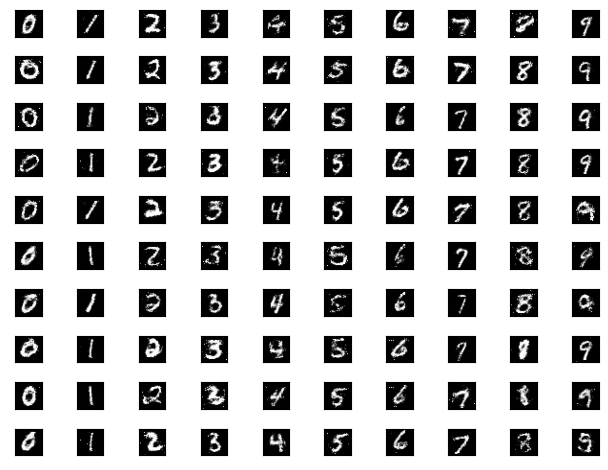

epoch = 93/100, d_loss=0.633, g_loss=0.950                                                                                                                        


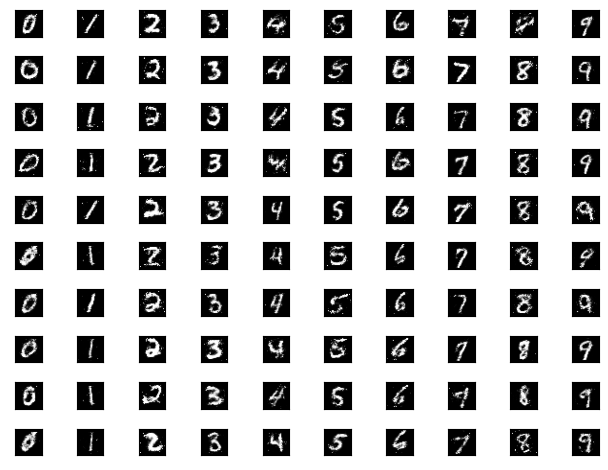

epoch = 94/100, d_loss=0.568, g_loss=0.990                                                                                                                        


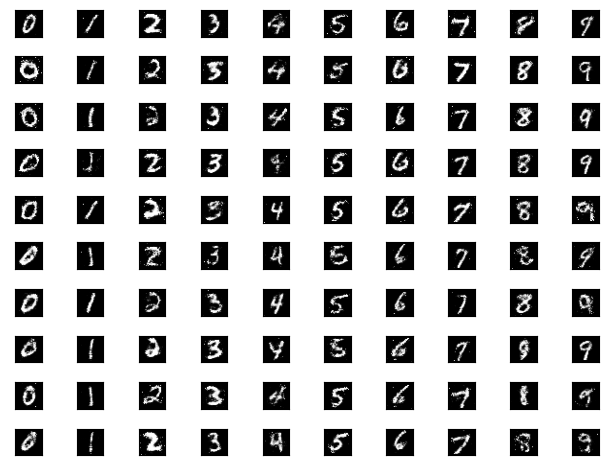

epoch = 95/100, d_loss=0.598, g_loss=1.033                                                                                                                        


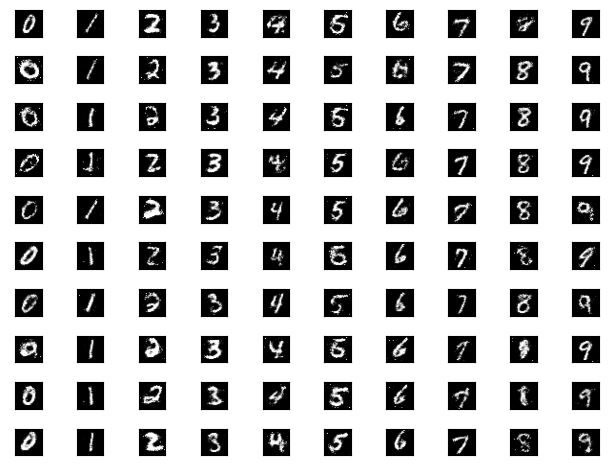

epoch = 96/100, d_loss=0.547, g_loss=0.996                                                                                                                        


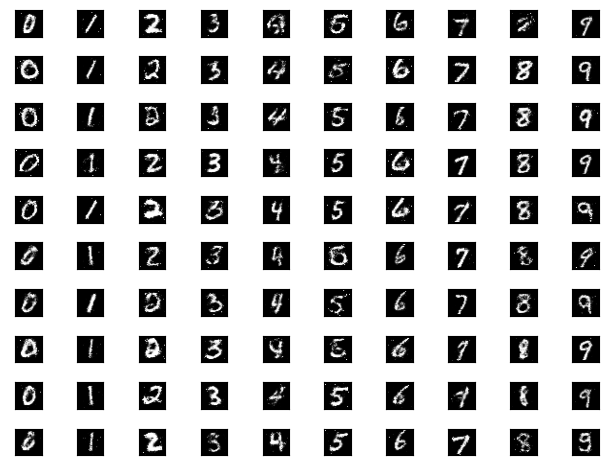

epoch = 97/100, d_loss=0.587, g_loss=0.985                                                                                                                        


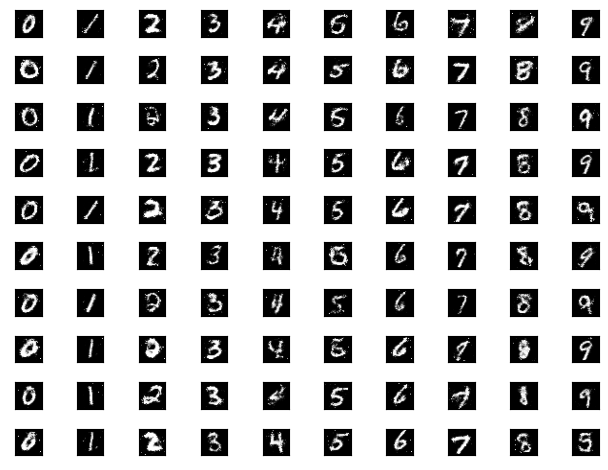

epoch = 98/100, d_loss=0.568, g_loss=0.975                                                                                                                        


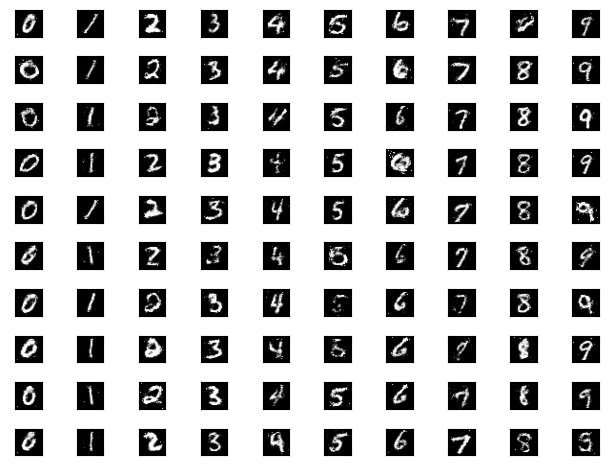

epoch = 99/100, d_loss=0.587, g_loss=0.940                                                                                                                        


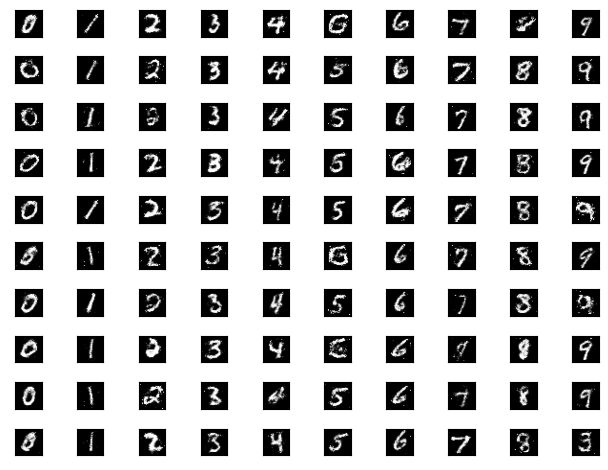

epoch = 100/100, d_loss=0.645, g_loss=1.001                                                                                                                        


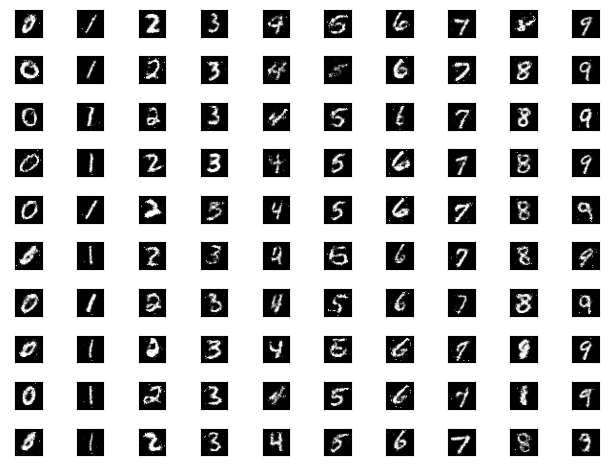

In [16]:
epochs = 100
batch_size = 32
smooth = 0.1

real = np.ones(shape=(batch_size, 1))
fake = np.zeros(shape=(batch_size, 1))

d_loss = []
d_g_loss = []

#plot details
samples = 100
noise = np.random.normal(loc=0, scale=1, size=(samples, latent_dim))
labels = np.arange(0, 100).reshape(-1, 1)
labels = labels % 10


for e in range(epochs):
    for i in range(len(X_train) // batch_size):
        
        # Train Discriminator weights
        discriminator.trainable = True
        
        # Real samples
        X_batch = X_train[i*batch_size:(i+1)*batch_size]
        real_labels = y_train[i*batch_size:(i+1)*batch_size].reshape(-1, 1)
        
        d_loss_real = discriminator.train_on_batch(x=[X_batch, real_labels], y=real * (1 - smooth))
        
        # Fake Samples
        z = np.random.normal(loc=0, scale=1, size=(batch_size, latent_dim))
        random_labels = np.random.randint(0, 10, batch_size).reshape(-1, 1)
        X_fake = generator.predict_on_batch([z, random_labels])
        
        d_loss_fake = discriminator.train_on_batch(x=[X_fake, random_labels], y=fake)
         
        # Discriminator loss
        d_loss_batch = 0.5 * (d_loss_real[0] + d_loss_fake[0])
        
        # Train Generator weights
        discriminator.trainable = False
        
        z = np.random.normal(loc=0, scale=1, size=(batch_size, latent_dim))
        random_labels = np.random.randint(0, 10, batch_size).reshape(-1, 1)
        d_g_loss_batch = d_g.train_on_batch(x=[z, random_labels], y=real)
   
        print(
            'epoch = %d/%d, batch = %d/%d, d_loss=%.3f, g_loss=%.3f' % (e + 1, epochs, i, len(X_train) // batch_size, d_loss_batch, d_g_loss_batch[0]),
            100*' ',
            end='\r'
        )
    
    d_loss.append(d_loss_batch)
    d_g_loss.append(d_g_loss_batch[0])
    print('epoch = %d/%d, d_loss=%.3f, g_loss=%.3f' % (e + 1, epochs, d_loss[-1], d_g_loss[-1]), 100*' ')


    # plotting part
    # noise matrix is consistent in all iterations
    x_fake = generator.predict([noise, labels])
    for k in range(samples):
        plt.subplot(10, 10, k+1)
        plt.imshow(x_fake[k].reshape(28, 28), cmap='gray')
        plt.xticks([])
        plt.yticks([])


    plt.tight_layout()
    plt.savefig(f'./images3/eoch_{e+1}.jpeg')
    plt.show()

# plots

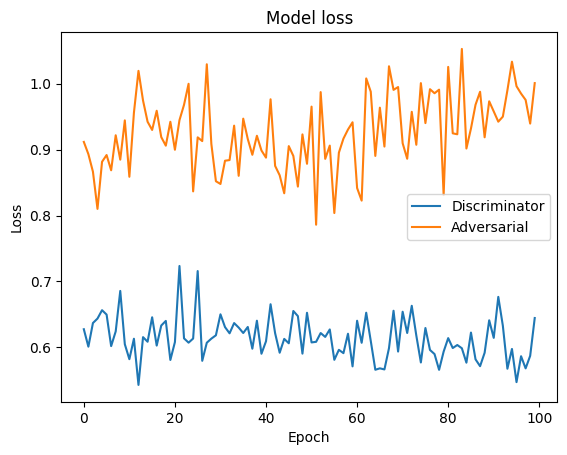

In [17]:
# plotting the metrics
plt.plot(d_loss)
plt.plot(d_g_loss)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Discriminator', 'Adversarial'], loc='center right')
plt.show()

In [2]:
import imageio
import os

def create_gif(folder, gif_name):
    images = []
    for filename in os.listdir(folder):
        if filename.endswith('.jpeg') or filename.endswith('.png'):
            file_path = os.path.join(folder, filename)
            images.append(imageio.imread(file_path))
    imageio.mimsave(gif_name, images, fps=10)

create_gif("./images3", "animation.gif")

C:\Users\KASHANI\AppData\Local\Temp\ipykernel_12360\1298283447.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))
